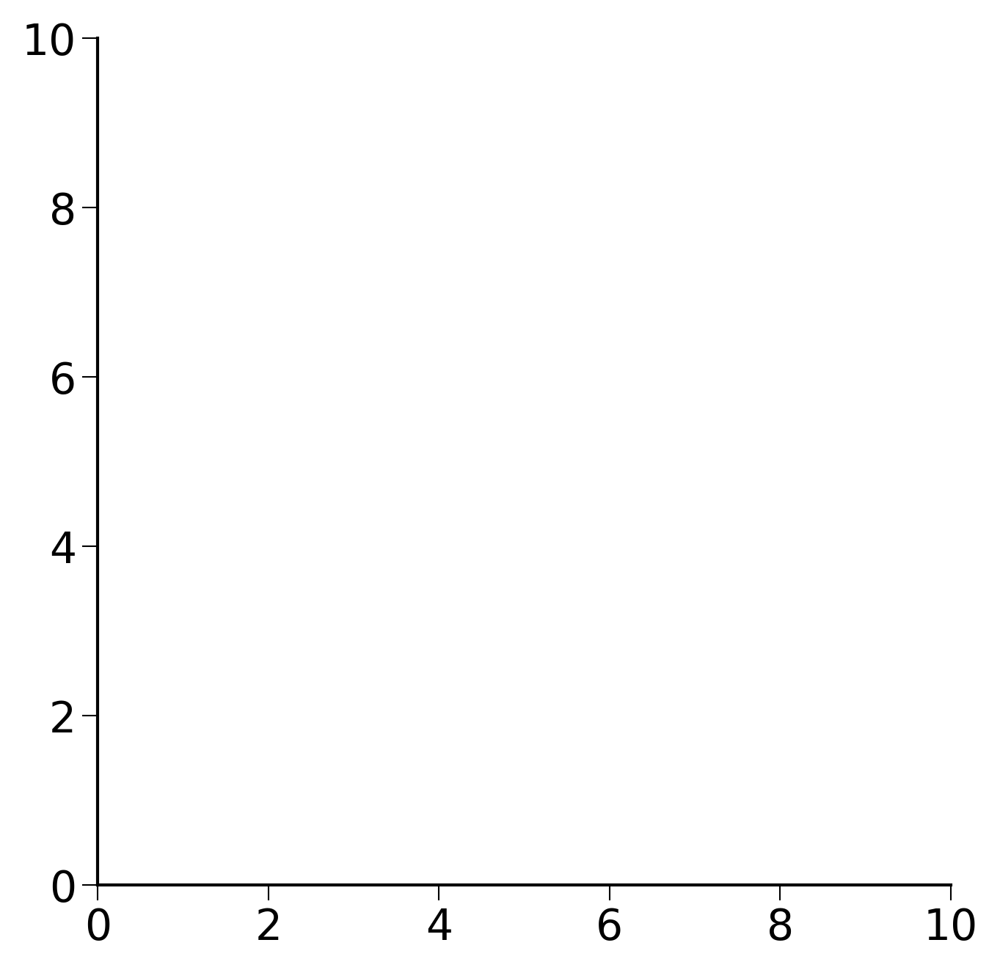

In [478]:
import scanpy as sc
import numpy as np
import operator
import pandas as pd
import torch.nn.functional as F
import torch.nn as nn
import scanpy as sc
import matplotlib.pyplot as plt
import torch
import os
#setPltLinewidth(0)
# os.environ["CUDA_VISIBLE_DEVICES"] = "1,2,6,7"

from torch.nn import DataParallel
import os
import anndata as ad
import cospar as cs
import scanpy as sc
def createFig(figsize=(8, 4)):
    fig,ax=plt.subplots()           
    ax.spines['right'].set_color('none')     
    ax.spines['top'].set_color('none')
    #ax.spines['bottom'].set_color('none')     
    #ax.spines['left'].set_color('none')
    for line in ax.yaxis.get_ticklines():
        line.set_markersize(5)
        line.set_color("#585958")
        line.set_markeredgewidth(0.5)
    for line in ax.xaxis.get_ticklines():
        line.set_markersize(5)
        line.set_markeredgewidth(0.5)
        line.set_color("#585958")
    ax.set_xbound(0,10)
    ax.set_ybound(0,10)
    fig.set_size_inches(figsize)
    return fig,ax
def setPltLinewidth(linewidth:float):
    mpl.rcParams['axes.linewidth'] = linewidth
import matplotlib as mpl
fig,ax=createFig()
fig.set_size_inches(5,5)
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42
setPltLinewidth(1)
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.size'] = 14
plt.rcParams['axes.linewidth'] = 1
#adata = cs.hf.read('/home/zhengtuo/songtao/weinreb_log2.h5ad')
#adata=cs.hf.read("/home/zhengtuo/songtao/DestinyNet/rebuttal6.1/LARRY_sp500_ranking1_adata_preprocessed.h5ad")
#adata=cs.datasets.hematopoiesis_subsampled()
adata =cs.hf.read('/home/zhengtuo/songtao/weinreb_endpoint.h5ad')
#sc.pp.log1p(adata)


In [446]:
df_clone=cs.tl.clone_statistics(adata,joint_variable='state_info');
cs.tl.add_clone_id_for_each_cell(adata)
np.sum((adata.obsm['X_clone'].sum(0)>0).A.flatten())#5857


/home/zhengtuo/miniconda3/envs/jst/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


                                     clone_N  clone_fraction
state_info                                                  
Baso                                     279        0.070651
Baso,Eos                                  17        0.004305
Baso,Erythroid                             1        0.000253
Baso,Monocyte                              5        0.001266
Baso,Monocyte,Eos                          1        0.000253
...                                      ...             ...
undiff,Neutrophil,Lymphoid,Monocyte        1        0.000253
undiff,Neutrophil,Monocyte                62        0.015700
undiff,Neutrophil,Monocyte,Eos             1        0.000253
undiff,Neutrophil,Neu_Mon                  2        0.000506
undiff,pDC                                 6        0.001519

[137 rows x 2 columns]
-----------
            cell_N  clonal_cell_fraction
state_info                              
Baso          4453              0.150597
Ccr7_DC         40              0.001353
Eos    

/home/zhengtuo/miniconda3/envs/jst/lib/python3.9/site-packages/cospar/tool/_clone.py:552: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["clone_id"] = clone_id


add information at obs['clone_id']


3949

In [448]:
adata


AnnData object with n_obs × n_vars = 49116 × 25289
    obs: 'time_info', 'state_info', 'NeuMon_fate_bias', 'NeuMon_mask', 'progenitor_Ccr7_DC', 'progenitor_Mast', 'progenitor_Meg', 'progenitor_pDC', 'progenitor_Eos', 'progenitor_Lymphoid', 'progenitor_Erythroid', 'progenitor_Baso', 'progenitor_Neutrophil', 'progenitor_Monocyte', 'sp_500_idx', 'MLPClassifier_predicted_bias', 'growth_rate_raw', 'growth_rate_smooth'
    uns: 'OT_transition_map', 'Tmap_cell_id_t1', 'Tmap_cell_id_t2', 'available_map', 'clonal_cell_id_t1', 'clonal_cell_id_t2', 'clonal_time_points', 'data_des', 'progenitor_Monocyte_colors', 'sp_idx', 'state_info_colors', 'time_ordering', 'transition_map'
    obsm: 'X_clone', 'X_emb', 'X_pca'

In [476]:
adata.obs['index']=range((adata.shape[0]))
adata.obs['index']=adata.obs.index.astype(int)
adata.obs['time_info']=adata.obs['time_info'].astype(int)
adata.obs['time_info'] = adata.obs['time_info'].replace(24, 2)


In [473]:
all_cell=list(set(list(df['cell1'])+list(df['cell2'])))
#len(all_cell)
adata[adata.obs['index'].isin(all_cell)]

View of AnnData object with n_obs × n_vars = 13253 × 25289
    obs: 'time_info', 'state_info', 'NeuMon_fate_bias', 'NeuMon_mask', 'progenitor_Ccr7_DC', 'progenitor_Mast', 'progenitor_Meg', 'progenitor_pDC', 'progenitor_Eos', 'progenitor_Lymphoid', 'progenitor_Erythroid', 'progenitor_Baso', 'progenitor_Neutrophil', 'progenitor_Monocyte', 'sp_500_idx', 'MLPClassifier_predicted_bias', 'growth_rate_raw', 'growth_rate_smooth', 'index'
    uns: 'OT_transition_map', 'Tmap_cell_id_t1', 'Tmap_cell_id_t2', 'available_map', 'clonal_cell_id_t1', 'clonal_cell_id_t2', 'clonal_time_points', 'data_des', 'progenitor_Monocyte_colors', 'sp_idx', 'state_info_colors', 'time_ordering', 'transition_map'
    obsm: 'X_clone', 'X_emb', 'X_pca'

In [477]:
all_cell=list(set(list(df['cell1'])+list(df['cell2'])))
#len(all_cell)
adata[adata.obs['index'].isin(all_cell)]

View of AnnData object with n_obs × n_vars = 11731 × 25289
    obs: 'time_info', 'state_info', 'NeuMon_fate_bias', 'NeuMon_mask', 'progenitor_Ccr7_DC', 'progenitor_Mast', 'progenitor_Meg', 'progenitor_pDC', 'progenitor_Eos', 'progenitor_Lymphoid', 'progenitor_Erythroid', 'progenitor_Baso', 'progenitor_Neutrophil', 'progenitor_Monocyte', 'sp_500_idx', 'MLPClassifier_predicted_bias', 'growth_rate_raw', 'growth_rate_smooth', 'index'
    uns: 'available_map', 'clonal_time_points', 'data_des', 'progenitor_Monocyte_colors', 'state_info_colors', 'time_ordering'
    obsm: 'X_clone', 'X_emb', 'X_pca'

In [170]:
import numpy as np
import pandas as pd

# 假设 adata 是你的 AnnData 对象
# 如果你还没有导入 adata，请先导入

# 获取克隆矩阵
clone_matrix = adata.obsm['X_clone'].toarray()

# 获取时间、状态信息和 NeuMon_fate_bias
time_info = adata.obs['time_info']
state_info = adata.obs['state_info']
neumon_fate_bias = adata.obs['NeuMon_fate_bias']

# 创建结果列表
results = []

# 遍历克隆矩阵
for clone_id in range(clone_matrix.shape[1]):
    # 获取属于这个克隆的所有细胞
    cells_in_clone = np.where(clone_matrix[:, clone_id] == 1)[0]
    
    # 获取这个克隆中的 undiff 细胞 (时间点为 2 或 4，且 NeuMon_fate_bias != 0.5)
    undiff_cells = [cell for cell in cells_in_clone if state_info[cell] == 'undiff' 
                    and time_info[cell] in [2] 
                    and neumon_fate_bias[cell] != 0.5]
    
    # 获取这个克隆中的分化细胞 (时间点大于 2)
    diff_cells = [cell for cell in cells_in_clone if state_info[cell] != 'undiff' and time_info[cell] !=2]
    
    # 生成关系
    for undiff_cell in undiff_cells:
        for diff_cell in diff_cells:
            if time_info[diff_cell] > time_info[undiff_cell]:
                results.append({
                    'cell1': undiff_cell,
                    'cell1_type': state_info[undiff_cell],
                    'cell1_day': time_info[undiff_cell],
                    'cell2': diff_cell,
                    'cell2_type': state_info[diff_cell],
                    'cell2_day': time_info[diff_cell],
                    'clone_id': clone_id
                })

# 创建 DataFrame
df = pd.DataFrame(results)

# 保存为 CSV 文件
df.to_csv('/home/zhengtuo/songtao/clone_relations.csv', index=False)

print(df.head())

   cell1 cell1_type  cell1_day  cell2  cell2_type  cell2_day  clone_id
0   8980     undiff          2  44782  Neutrophil          6         9
1   8980     undiff          2  46058  Neutrophil          6         9
2  38141     undiff          2  44782  Neutrophil          6         9
3  38141     undiff          2  46058  Neutrophil          6         9
4  17001     undiff          2  43478        Baso          6        11


In [173]:
df['cell2_type'].unique()

array(['Neutrophil', 'Baso', 'Mast', 'Monocyte', 'Lymphoid', 'Ccr7_DC',
       'Neu_Mon', 'Eos', 'Meg', 'pDC', 'Erythroid'], dtype=object)

In [3]:
dic_true={}
adata.obs['GT']=None
for i in range((adata.shape[0])):
    if(adata.obs['NeuMon_fate_bias'][i]>0.5):
        dic_true[adata.obs['index'][i]]=1
        if(adata.obs['state_info'][i]=='undiff'):
            adata.obs['GT'][i]='Neu'
    elif(adata.obs['NeuMon_fate_bias'][i]<0.5):
        dic_true[adata.obs['index'][i]]=0
        if(adata.obs['state_info'][i]=='undiff'):
            adata.obs['GT'][i]='Mo'
    else:
        if(adata.obs['state_info'][i]=='undiff'):
            dic_true[adata.obs['index'][i]]=2
#adata.obs['GT'].value_counts()

In [12]:
adata.obs['state_info'].unique()

['undiff', 'Monocyte', 'Neutrophil', 'Baso', 'Erythroid', ..., 'Lymphoid', 'Eos', 'Neu_Mon', 'Ccr7_DC', 'pDC']
Length: 12
Categories (12, object): ['Baso', 'Ccr7_DC', 'Eos', 'Erythroid', ..., 'Neu_Mon', 'Neutrophil', 'pDC', 'undiff']

In [490]:
sc.pp.log1p(adata)
# adata.X=adata.X.toarray()

In [369]:
adata_disp=cs.hf.read("/home/zhengtuo/songtao/DestinyNet/rebuttal6.1/LARRY_sp500_ranking1_adata_preprocessed.h5ad")


In [370]:
adata_disp.obs

,time_info,state_info,NeuMon_fate_bias,NeuMon_mask,progenitor_Ccr7_DC,progenitor_Mast,progenitor_Meg,progenitor_pDC,progenitor_Eos,progenitor_Lymphoid,progenitor_Erythroid,progenitor_Baso,progenitor_Neutrophil,progenitor_Monocyte,sp_500_idx,MLPClassifier_predicted_bias
4,6,Neutrophil,0.5,False,0,0,0,0,0,0,0,0,0,0,True,1.0
5,6,Monocyte,0.5,False,0,0,0,0,0,0,0,0,0,0,True,0.0
10,6,Baso,0.5,False,0,0,0,0,0,0,0,0,0,0,True,1.0
14,6,Monocyte,0.5,False,0,0,0,0,0,0,0,0,0,0,True,0.0
15,6,Monocyte,0.5,False,0,0,0,0,0,0,0,0,0,0,True,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49033,6,Baso,0.5,False,0,0,0,0,0,0,0,0,0,0,True,1.0
49040,6,undiff,0.5,True,0,0,0,0,0,0,0,0,0,0,True,1.0
49044,6,Neutrophil,0.5,False,0,0,0,0,0,0,0,0,0,0,True,1.0
49066,6,Neutrophil,0.5,False,0,0,0,0,0,0,0,0,0,0,True,1.0


In [ ]:
adata.obs['id']=0
sum=1
for i in adata.obsm['X_clone'].T:
    item1=i.toarray()
    for j in range(len(item1[0])):
        if(item1[0][j]==True):
            adata.obs['id'][j]=sum
    sum+=1
        


In [274]:
fatetrue=[]
adata2=adata[(adata.obs['NeuMon_fate_bias']!=0.5)]
for i in range((adata2.shape[0])):
    if(adata2.obs['NeuMon_fate_bias'][i]>0.5):
        fatetrue.append(1)
    else:
        fatetrue.append(0)

In [40]:
adata3=adata2[(adata2.obs['state_info']=='undiff')&(adata2.obs['time_info'].isin(['2','4']))]
adata3.obs['index']=0
adata3.obs['index']=adata3.obs.index.astype(int)

/tmp/ipykernel_22753/711393511.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata3.obs['index']=0


In [462]:
#开始训练！！！！！！！！
df = pd.read_csv("/home/zhengtuo/songtao/clone_relations.csv")
df=df[(df['cell2_type']!='undiff')&(df['cell2_type']!='Neu_Mon')]
df=df[(df['cell1_type']=='undiff')]
df=df[(df['cell2_type']!='Meg')&(df['cell2_type']!='Erythroid')&(df['cell2_type']!='pDC')]

#df=df[df['cell1'].isin(adata_disp.obs.index.astype(int))]
import random
df2 = [df for _, df in df.groupby('clone_id')]
random.shuffle(df2)
print(len(df2))
print(len(df2)*0.7)
len_train=570#len(a)*0.7 1317
len_test=len(df2)-len_train#len(a)-len_train 565
cell_day2_all=list(set(list(df['cell1'])))
cell_day46_all=list(set(list(df['cell2'])))
dic_sameBC={}
for j in df2:
    item1=(j.values.T[0])
    item2=list(set(j.values.T[3]))
    for i in item1:
        dic_sameBC[i]=item2

814
569.8


In [461]:
570,244

244

In [475]:
#开始训练！！！！！！！！
df = pd.read_csv("/home/zhengtuo/songtao/weinreb.csv")
df=df[(df['cell2_type']!='undiff')&(df['cell2_type']!='Neu_Mon')]
df=df[(df['cell1_type']=='undiff')]
#df=df[df['cell1'].isin(adata_disp.obs.index.astype(int))]
import random
df2 = [df for _, df in df.groupby('clone_id')]
random.shuffle(df2)
print(len(df2)*0.7)
len_train=990#len(a)*0.7 1317
len_test=len(df2)-len_train#len(a)-len_train 565
cell_day2_all=list(set(list(df['cell1'])))
cell_day46_all=list(set(list(df['cell2'])))
dic_sameBC={}
for j in df2:
    item1=(j.values.T[0])
    item2=list(set(j.values.T[3]))
    for i in item1:
        dic_sameBC[i]=item2

990.4999999999999


In [338]:
final_df['clone_id'].unique().shape
#df = pd.read_csv("/home/zhengtuo/songtao/clone_relations.csv")


(708,)

In [411]:
#Homoplasy Challenge
import pandas as pd
import random

# 读取数据
df = pd.read_csv("/home/zhengtuo/songtao/weinreb.csv")
df = df[(df['cell1_type'] == 'undiff') & 
        (df['cell2_type'] != 'undiff') & 
        (df['cell2_type'] != 'Neu_Mon') ]

# 获取所有不同的 clone_id
unique_clone_ids = df['clone_id'].unique()

# 随机打乱 clone_id 列表
random.shuffle(unique_clone_ids)

# 合并 clone_id
merged_data = []
for i in range(0, len(unique_clone_ids) - 1, 2):
    # 选择两个 clone_id
    clone_id_1 = unique_clone_ids[i]
    clone_id_2 = unique_clone_ids[i + 1]
    
    # 过滤出这两个 clone_id 的数据行
    selected_df = df[df['clone_id'].isin([clone_id_1, clone_id_2])]

    # 创建一个新的 clone_id
    new_clone_id = f"{clone_id_1}_{clone_id_2}"

    # 替换原数据中的 clone_id
    selected_df['clone_id'] = new_clone_id

    # 添加到合并数据列表
    merged_data.append(selected_df)

# 如果有剩余的 clone_id，单独保留
if len(unique_clone_ids) % 2 != 0:
    remaining_clone_id = unique_clone_ids[-1]
    remaining_df = df[df['clone_id'] == remaining_clone_id]
    merged_data.append(remaining_df)

# 将所有合并的数据合并到一个 DataFrame 中
final_df = pd.concat(merged_data, ignore_index=True)

# 打印合并后的结果


/tmp/ipykernel_67627/3300439078.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_df['clone_id'] = new_clone_id


In [421]:
#Dispersed CLone Challenge
df = final_df
#df=df[df['cell1'].isin(adata_disp.obs.index.astype(int))]
import random
df2 = [df for _, df in df.groupby('clone_id')]
random.shuffle(df2)
print(len(df2)*1)
len_train=708*0.7#len(a)*0.7 1317
len_test=len(df2)-len_train#len(a)-len_train 565
cell_day2_all=list(set(list(df['cell1'])))
cell_day46_all=list(set(list(df['cell2'])))
dic_sameBC={}
for j in df2:
    item1=(j.values.T[0])
    item2=list(set(j.values.T[3]))
    for i in item1:
        dic_sameBC[i]=item2

708


In [404]:
495,213

213

In [355]:
#Clone_size_Challenge1
import pandas as pd
import random

# 读取数据
df = pd.read_csv("/home/zhengtuo/songtao/weinreb.csv")

# 筛选数据
df = df[(df['cell1_type'] == 'undiff') & (df['cell2_type'] != 'undiff') & (df['cell2_type'] != 'Neu_Mon')]

# 按 clone_id 分组并计算每个 clone 的大小
clone_size = df.groupby('clone_id').size()

# 设置阈值
threshold = 30

# 将数据按克隆大小分为训练集和测试集
train_clone_ids = clone_size[clone_size > threshold].index
test_clone_ids = clone_size[clone_size <= threshold].index

train_df = df[df['clone_id'].isin(train_clone_ids)]
test_df = df[df['clone_id'].isin(test_clone_ids)]

# 将数据按 clone_id 分组
train_groups = [group for _, group in train_df.groupby('clone_id')]
test_groups = [group for _, group in test_df.groupby('clone_id')]

# 打乱数据
random.shuffle(train_groups)
random.shuffle(test_groups)

# 标签字典
dic = {'Monocyte': 0, 'Neutrophil': 1, 'Lymphoid': 2, 'Mast': 3, 'Ccr7_DC': 4, 'Baso': 5, 'Eos': 6}

# 初始化训练和测试集合
train_rel = []
test_rel = []
traincell1 = []
traincell2 = []
testcell1 = []
testcell2 = []

# 初始化记录同一条克隆上的所有细胞的字典
dic_sameBC = {}

# 构建训练集
for group in train_groups:
    cell1_index = group['cell1'].values
    cell2_index = group['cell2'].values
    for cell1, cell2 in zip(cell1_index, cell2_index):
        if cell1 not in dic_sameBC:
            dic_sameBC[cell1] = []
        dic_sameBC[cell1].append(cell2)
    for count in range(len(cell1_index)):
        if group['cell2_type'].values[count] != 'undiff':
            train_rel.append(dic[group['cell2_type'].values[count]])
            traincell1.append(cell1_index[count])
            traincell2.append(cell2_index[count])

# 构建测试集
for group in test_groups:
    cell1_index = group['cell1'].values
    cell2_index = group['cell2'].values
    for cell1, cell2 in zip(cell1_index, cell2_index):
        if cell1 not in dic_sameBC:
            dic_sameBC[cell1] = []
        dic_sameBC[cell1].append(cell2)
    for count in range(len(cell1_index)):
        if group['cell2_type'].values[count] != 'undiff':
            test_rel.append(dic[group['cell2_type'].values[count]])
            testcell1.append(cell1_index[count])
            testcell2.append(cell2_index[count])

print("训练集大小:", len(train_rel))
print("测试集大小:", len(test_rel))
#print("同一条克隆上的细胞:", dic_sameBC)


训练集大小: 19916
测试集大小: 8264


In [150]:
#clone_size_Challenge2
import pandas as pd
import random

# 读取数据
df = pd.read_csv("/home/zhengtuo/songtao/weinreb.csv")

# 筛选数据
df = df[(df['cell1_type'] == 'undiff') & (df['cell2_type'] != 'undiff') & (df['cell2_type'] != 'Neu_Mon')]

# 按 clone_id 分组并计算每个 clone 的大小
clone_size = df.groupby('clone_id').size()

# 设置阈值
threshold = 30

# 将数据按克隆大小分为训练集和测试集
train_clone_ids = clone_size[clone_size <= threshold].index
test_clone_ids = clone_size[clone_size > threshold].index

train_df = df[df['clone_id'].isin(train_clone_ids)]
test_df = df[df['clone_id'].isin(test_clone_ids)]

# 将数据按 clone_id 分组
train_groups = [group for _, group in train_df.groupby('clone_id')]
test_groups = [group for _, group in test_df.groupby('clone_id')]

# 打乱数据
random.shuffle(train_groups)
random.shuffle(test_groups)

# 标签字典
dic = {'Monocyte': 0, 'Neutrophil': 1, 'Lymphoid': 2, 'Mast': 3, 'Ccr7_DC': 4, 'Baso': 5, 'Eos': 6}

# 初始化训练和测试集合
train_rel = []
test_rel = []
traincell1 = []
traincell2 = []
testcell1 = []
testcell2 = []

# 构建训练集
for group in train_groups:
    cell1_index = group['cell1'].values
    cell2_index = group['cell2'].values
    for count in range(len(cell1_index)):
        if group['cell2_type'].values[count] != 'undiff':
            train_rel.append(dic[group['cell2_type'].values[count]])
            traincell1.append(cell1_index[count])
            traincell2.append(cell2_index[count])

# 构建测试集
for group in test_groups:
    cell1_index = group['cell1'].values
    cell2_index = group['cell2'].values
    for count in range(len(cell1_index)):
        if group['cell2_type'].values[count] != 'undiff':
            test_rel.append(dic[group['cell2_type'].values[count]])
            testcell1.append(cell1_index[count])
            testcell2.append(cell2_index[count])

print("训练集大小:", len(train_rel))
print("测试集大小:", len(test_rel))


训练集大小: 8264
测试集大小: 19916


In [359]:
len(train_clone_ids),+len(test_clone_ids)

(48141, 71664)

In [387]:
# import pandas as pd
# import random

# # Load the CSV file
# df = pd.read_csv("/home/zhengtuo/songtao/weinreb.csv")

# # Filter the DataFrame
# df = df[(df['cell1_type'] == 'undiff') & (df['cell2_type'] != 'undiff') & (df['cell2_type'] != 'Neu_Mon')]

# # Group by clone_id and calculate the size of each group
# clone_size = df.groupby('clone_id').size()

# # Calculate the median size
# median_size = 100

# # Split the DataFrame into two based on the median size
# df_large = df[df['clone_id'].isin(clone_size[clone_size > median_size].index)]
# df_small = df[df['clone_id'].isin(clone_size[clone_size <= median_size].index)]

# df2 = [df for _, df in df_large.groupby('clone_id')]
# print(len(df2) * 0.7 )
# random.shuffle(df2)
# len_train=34#len(a)*0.7 1317
# len_test=len(df2)-len_train#len(a)-len_train 565
# cell_day2_all=list(set(list(df['cell1'])))
# cell_day46_all=list(set(list(df['cell2'])))
# dic_sameBC={}
# for j in df2:
#     item1=(j.values.T[0])
#     item2=list(set(j.values.T[3]))
#     for i in item1:
#         dic_sameBC[i]=item2

In [386]:
# import pandas as pd
# import matplotlib.pyplot as plt
# import numpy as np

# # Load the CSV file
# #df = pd.read_csv("/home/zhengtuo/songtao/weinreb.csv")

# # Filter the DataFrame
# #df = df[(df['cell1_type'] == 'undiff') & (df['cell2_type'] != 'undiff') & (df['cell2_type'] != 'Neu_Mon')]

# # Group by clone_id and calculate the size of each group
# clone_size = df.groupby('clone_id').size()

# # Sort clone sizes from smallest to largest
# sorted_clone_size = clone_size.sort_values()

# # Plot the clone size distribution
# plt.figure(figsize=(10, 8))
# sorted_clone_size.plot(kind='bar', linewidth=2)
# plt.title('Clone Size Distribution')
# plt.ylabel('Size')
# plt.gca().axes.get_xaxis().set_visible(False)  # Hide x-axis
# plt.show()


In [134]:
print(len(set(traincell1))+len(set(traincell2)))#1686
print(len(set(testcell1))+len(set(testcell2)))#1979
# print(len((train_groups)))#942
# print(len((test_groups)))#473

8005
3726


In [463]:
#Construct Triplet
testcell1=[]
testcell2=[]
traincell1=[]
traincell2=[]
train_rel=[]
test_rel=[]

dic={'Monocyte':0, 'Neutrophil':1, 'Lymphoid':2,'Mast':3, 'Ccr7_DC':4,
       'Baso':5, 'Eos':6}
# dic={'Monocyte':0, 'Neutrophil':0, 'Lymphoid':0,'Mast':0, 'Ccr7_DC':0,
# 'Baso':0, 'Eos':0}

# a=df.groupby('lineage_id')
sum_train=0
for j in df2:
    if(sum_train<len_train):
        cell1_index=j['cell1'].values
        cell2_index=j['cell2'].values
        sum_train+=1
        for count in range(len(cell1_index)):
            if(j['cell2_type'].values[count]!='unidff'):
                #if(j['cell2_type'].values[count]=='Monocyte' or j['cell2_type'].values[count]=='Neutrophil'):
                    train_rel.append(dic[j['cell2_type'].values[count]])
                    traincell1.append(cell1_index[count])
                    traincell2.append(cell2_index[count])
    else:
        cell1_index=j['cell1'].values
        cell2_index=j['cell2'].values
        sum_train+=1
        for count in range(len(cell1_index)):
            if(j['cell2_type'].values[count]!='undiff'):
                #dic_sameBC[cell1_index[count]].append(cell2_index[count])
                #dic_sameBC[cell1_index[count]]=cell2_index
                test_rel.append(dic[j['cell2_type'].values[count]])
                testcell1.append(cell1_index[count])
                testcell2.append(cell2_index[count])
        



In [372]:
#dispersed clone Challenge

import pandas as pd
import random
# 读取数据
df = pd.read_csv("/home/zhengtuo/songtao/weinreb.csv")

# 筛选数据
df = df[(df['cell1_type'] == 'undiff') & (df['cell2_type'] != 'undiff') & (df['cell2_type'] != 'Neu_Mon')]

# 获取符合条件的训练集和测试集
train_df = df[df['cell1'].isin(adata_disp.obs.index.astype(int))]
test_df = df[~df['cell1'].isin(adata_disp.obs.index.astype(int))]

# 将数据按 clone_id 分组
train_groups = [group for _, group in train_df.groupby('clone_id')]
test_groups = [group for _, group in test_df.groupby('clone_id')]

# 打乱数据
random.shuffle(train_groups)
random.shuffle(test_groups)

# 标签字典
dic = {'Monocyte': 0, 'Neutrophil': 1, 'Lymphoid': 2, 'Mast': 3, 'Ccr7_DC': 4, 'Baso': 5, 'Eos': 6}

# 初始化训练和测试集合
train_rel = []
test_rel = []
traincell1 = []
traincell2 = []
testcell1 = []
testcell2 = []

# 构建训练集
for group in train_groups:
    cell1_index = group['cell1'].values
    cell2_index = group['cell2'].values
    for count in range(len(cell1_index)):
        if group['cell2_type'].values[count] != 'undiff':
            train_rel.append(dic[group['cell2_type'].values[count]])
            traincell1.append(cell1_index[count])
            traincell2.append(cell2_index[count])

# 构建测试集
for group in test_groups:
    cell1_index = group['cell1'].values
    cell2_index = group['cell2'].values
    for count in range(len(cell1_index)):
        if group['cell2_type'].values[count] != 'undiff':
            test_rel.append(dic[group['cell2_type'].values[count]])
            testcell1.append(cell1_index[count])
            testcell2.append(cell2_index[count])

print("训练集大小:", len(train_rel))
print("测试集大小:", len(test_rel))


训练集大小: 3531
测试集大小: 24649


In [374]:
len(train_rel),len(test_rel)

(3531, 24649)

In [377]:
##Lineage Dropout Experiements
import pandas as pd
import random
import numpy as np

# 读取数据
df = pd.read_csv("/home/zhengtuo/songtao/weinreb.csv")

# 筛选数据
df = df[(df['cell1_type'] == 'undiff') & (df['cell2_type'] != 'undiff') & (df['cell2_type'] != 'Neu_Mon')]

# 按 clone_id 分组
clone_ids = df['clone_id'].unique()

#random.seed(42)  # 为了可重复性，可以设置一个随机种子
train_clone_ids = random.sample(list(clone_ids), int(0.7 * len(clone_ids)))
test_clone_ids = [clone_id for clone_id in clone_ids if clone_id not in train_clone_ids]

train_df = df[df['clone_id'].isin(train_clone_ids)]
test_df = df[df['clone_id'].isin(test_clone_ids)]

# 将数据按 clone_id 分组
train_groups = [group for _, group in train_df.groupby('clone_id')]
test_groups = [group for _, group in test_df.groupby('clone_id')]

# 打乱数据
random.shuffle(train_groups)
random.shuffle(test_groups)

# 标签字典
dic = {'Monocyte': 0, 'Neutrophil': 1, 'Lymphoid': 2, 'Mast': 3, 'Ccr7_DC': 4, 'Baso': 5, 'Eos': 6}

# 初始化训练和测试集合
train_rel = []
test_rel = []
traincell1 = []
traincell2 = []
testcell1 = []
testcell2 = []

# 构建训练集
for group in train_groups:
    cell1_index = group['cell1'].values
    cell2_index = group['cell2'].values
    for count in range(len(cell1_index)):
        if group['cell2_type'].values[count] != 'undiff':
            train_rel.append(dic[group['cell2_type'].values[count]])
            traincell1.append(cell1_index[count])
            traincell2.append(cell2_index[count])

# 构建测试集
for group in test_groups:
    cell1_index = group['cell1'].values
    cell2_index = group['cell2'].values
    for count in range(len(cell1_index)):
        if group['cell2_type'].values[count] != 'undiff':
            test_rel.append(dic[group['cell2_type'].values[count]])
            testcell1.append(cell1_index[count])
            testcell2.append(cell2_index[count])

# 随机选择 30% 的条目索引以删除
def random_delete(cell1_list, cell2_list, rel_list, delete_ratio=0.3):
    delete_indices = np.random.choice(len(cell1_list), int(delete_ratio * len(cell1_list)), replace=False)
    cell1_list = [cell for idx, cell in enumerate(cell1_list) if idx not in delete_indices]
    cell2_list = [cell for idx, cell in enumerate(cell2_list) if idx not in delete_indices]
    rel_list = [rel for idx, rel in enumerate(rel_list) if idx not in delete_indices]
    return cell1_list, cell2_list, rel_list
print("训练集大小:", len(train_rel))
print("测试集大小:", len(test_rel))
traincell1, traincell2, train_rel = random_delete(traincell1, traincell2, train_rel, delete_ratio=0.3)
testcell1, testcell2, test_rel = random_delete(testcell1, testcell2, test_rel, delete_ratio=0.3)


print("删除后的训练集大小:", len(train_rel))
print("删除后的测试集大小:", len(test_rel))


训练集大小: 19472
测试集大小: 8708
删除后的训练集大小: 13631
删除后的测试集大小: 6096


In [364]:
len(train_rel),len(test_rel)

(13394, 6333)

In [464]:
##No relation的生成  5 3
num=25
from_index=list(set(traincell1))
for i in range(len(set(from_index))):
    print(i)
    a1=[]
    a1.append(from_index[i])
    cell1=np.random.choice(a1,num,replace=True)
    cell1=list(cell1)
    cell2_choice=set(traincell2)-set(dic_sameBC[cell1[0]])
    cell2=np.random.choice(list(set(cell2_choice)),num,replace=False)
    cell2=list(cell2)
    rel=np.random.choice([7],num,replace=True)
    rel=list(rel)
    traincell1+=cell1
    traincell2+=cell2
    train_rel+=rel

from_index=list(set(testcell1))
num=25
for i in range(len(set(from_index))):
    print(i)
    a1=[]
    a1.append(from_index[i])
    cell1=np.random.choice(a1,num,replace=True)
    cell1=list(cell1)
    cell2_choice=set(testcell2)-set(dic_sameBC[cell1[0]])
    cell2=np.random.choice(list(set(cell2_choice)),num,replace=False)
    cell2=list(cell2)
    rel=np.random.choice([7],num,replace=True)
    rel=list(rel)
    testcell1+=cell1
    testcell2+=cell2
    test_rel+=rel

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

386
387
388
389
390
391
392
393
394
395
396
397
398
399
400
401
402
403
404
405
406
407
408
409
410
411
412
413
414
415
416
417
418
419
420
421
422
423
424
425
426
427
428
429
430
431
432
433
434
435
436
437
438
439
440
441
442
443
444
445
446
447
448
449
450
451
452
453
454
455
456
457
458
459
460
461
462
463
464
465
466
467
468
469
470
471
472
473
474
475
476
477
478
479
480
481
482
483
484
485
486
487
488
489
490
491
492
493
494
495
496
497
498
499
500
501
502
503
504
505
506
507
508
509
510
511
512
513
514
515
516
517
518
519
520
521
522
523
524
525
526
527
528
529
530
531
532
533
534
535
536
537
538
539
540
541
542
543
544
545
546
547
548
549
550
551
552
553
554
555
556
557
558
559
560
561
562
563
564
565
566
567
568
569
570
571
572
573
574
575
576
577
578
579
580
581
582
583
584
585
586
587
588
589
590
591
592
593
594
595
596
597
598
599
600
601
602
603
604
605
606
607
608
609
610
611
612
613
614
615
616
617
618
619
620
621
622
623
624
625
626
627
628
629
630
631
632
633
634
635


In [ ]:
allindf=list(df['cell1'].unique())+list(df['cell2'].unique())
allindf=np.array(allindf)
adata2=adata[adata.obs['index'].isin(allindf)]
adata2


In [54]:
adata2.obs['state_info'].value_counts()

Monocyte      4449
undiff        3665
Neutrophil    3559
Baso            36
Ccr7_DC          7
Lymphoid         7
Mast             6
Eos              2
Name: state_info, dtype: int64

In [366]:
adata2=adata.copy()
adata2.obs['Cell type annotation']=None
adata2.obs['Cell type annotation']=adata2.obs['state_info']
adata2=adata2[adata2.obs['Cell type annotation'].isin(['Monocyte','Neutrophil','undiff'])]
dic={'Monocyte':'Monocyte','Neutrophil':'Neutrophil','undiff':'Undifferentiated'}
adata2.obs['Cell type annotation']=adata2.obs['Cell type annotation'].map(dic).values
sc.write('/home/zhengtuo/songtao/transfer_weinreb_forinvivo_3type.h5ad',adata2)

/tmp/ipykernel_5797/1137261707.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata2.obs['Cell type annotation']=adata2.obs['Cell type annotation'].map(dic).values


In [336]:
sc.write('/home/zhengtuo/songtao/transfer_weinreb_forinvivo_3type.h5ad',adata2)

In [491]:
sc.write('/home/zhengtuo/songtao/transfer_cosparweinreb.h5ad',adata)


In [279]:
##Scablity Experiements

testcell1 = []
testcell2 = []
traincell1 = []
traincell2 = []
train_rel = []
test_rel = []
dic = {
    'Monocyte': 0, 
    'Neutrophil': 1, 
    'Lymphoid': 2,
    'Mast': 3, 
    'Ccr7_DC': 4,
    'Baso': 5, 
    'Eos': 6
}

sum_train = 0
max_train_samples = 1000000  # 设置最大训练样本数
train_data_count = 0  # 记录当前训练数据的数量

for j in df2:
    if sum_train < len_train:
        cell1_index = j['cell1'].values
        cell2_index = j['cell2'].values
        sum_train += 1
        
        for count in range(len(cell1_index)):
            if j['cell2_type'].values[count] != 'unidff':
                if train_data_count < max_train_samples:  # 检查是否超过限制
                    train_rel.append(dic[j['cell2_type'].values[count]])
                    traincell1.append(cell1_index[count])
                    traincell2.append(cell2_index[count])
                    train_data_count += 1
    else:
        cell1_index = j['cell1'].values
        cell2_index = j['cell2'].values
        sum_train += 1
        
        for count in range(len(cell1_index)):
            if j['cell2_type'].values[count] != 'undiff':
                test_rel.append(dic[j['cell2_type'].values[count]])
                testcell1.append(cell1_index[count])
                testcell2.append(cell2_index[count])

# 如果训练数据不足，进行复制
while train_data_count < max_train_samples:
    for i in range(len(train_rel)):
        if train_data_count < max_train_samples:
            train_rel.append(train_rel[i])
            traincell1.append(traincell1[i])
            traincell2.append(traincell2[i])
            train_data_count += 1
        else:
            break

In [465]:
dic_train={}
dic_test={}
for i in train_rel:  
    dic_train[i] = dic_train.get(i, 0) + 1
print(dic_train) 
for i in test_rel:  
    dic_test[i] = dic_test.get(i, 0) + 1
print(dic_test)


{1: 17247, 0: 12481, 5: 6969, 4: 25, 3: 4761, 2: 54, 6: 329, 7: 39900}
{0: 9710, 1: 10696, 4: 50, 5: 6938, 6: 32, 2: 11, 3: 2318, 7: 23000}


(81766, 52755)

In [82]:
traincell1=np.loadtxt('/home/zhengtuo/songtao/2traincell1.txt')
traincell2=np.loadtxt('/home/zhengtuo/songtao/2traincell2.txt')
testcell1=np.loadtxt('/home/zhengtuo/songtao/2testcell1.txt')
testcell2=np.loadtxt('/home/zhengtuo/songtao/2testcell2.txt')
train_rel=np.loadtxt('/home/zhengtuo/songtao/2trainrel.txt',dtype=int)
test_rel=np.loadtxt('/home/zhengtuo/songtao/2testrel.txt',dtype=int)

In [385]:
np.savetxt('/home/zhengtuo/songtao/2traincell1.txt',traincell1)
np.savetxt('/home/zhengtuo/songtao/2traincell2.txt',traincell2)
np.savetxt('/home/zhengtuo/songtao/2testcell1.txt',testcell1)
np.savetxt('/home/zhengtuo/songtao/2testcell2.txt',testcell2)
np.savetxt('/home/zhengtuo/songtao/2trainrel.txt',train_rel,fmt='%d')
np.savetxt('/home/zhengtuo/songtao/2testrel.txt',test_rel,fmt='%d')


In [54]:
# class VAE(nn.Module):
#     def __init__(self, input_dim, hidden_dim, latent_dim,distribution='zinb'):
#         super(VAE, self).__init__()
#         self.input_dim = input_dim
#         self.hidden_dim = hidden_dim
#         self.latent_dim = latent_dim
#         self.fc1 = nn.Linear(input_dim, hidden_dim)
#         self.fc21 = nn.Linear(hidden_dim, latent_dim)
#         self.fc22 = nn.Linear(hidden_dim, latent_dim)
#         self.fc3 = nn.Linear(latent_dim, hidden_dim)
#         self.fc4 = nn.Linear(hidden_dim, input_dim)
#         self.fc5 = nn.Linear(hidden_dim, input_dim)
#         self.distribution = distribution
#         self.log_theta = torch.nn.Parameter(torch.randn(input_dim))
#     def encode(self, x):
#         h1 = F.softplus(self.fc1(x))
#         return self.fc21(h1), self.fc22(h1)

#     def reparameterize(self, mu, logvar):
#         std = torch.exp(0.5 * logvar)
#         eps = torch.randn_like(std)
#         return mu + eps*std

#     def decode(self, z):
#         h3 = F.softplus(self.fc3(z))
#         mu = self.fc4(h3)
#         dropout_logits = self.fc5(h3)
#         return torch.exp(mu), dropout_logits

#     def forward(self, x):
#         #x = torch.log(x+1)

#         mu, logvar = self.encode(x.view(-1, self.input_dim))
#         embedding=mu+logvar
#         z = self.reparameterize(mu, logvar)

#         # For the ZINB distribution
#         de_mean, de_dropout = self.decode(z)

#         # Calculate loss
#         recon_loss = self.reconstruction_loss(x, de_mean, de_dropout)
#         kl_div = self.kl_d(mu, logvar)
#         total_loss = -recon_loss + kl_div

#         return embedding, total_loss
    
   
#     def get_latent_representation(self, x):
#         mu, logvar = self.encode(x.view(-1, self.input_dim))
#         return mu+logvar
#     # def getnerate
#     def generate(self, x, sample_shape,random=False):
#         '''
#         generate samples from the model
#         sample_shape: shape of sample
#         '''
#         mu, logvar = self.encode(x.view(-1, self.input_dim))
#         if random:
#             z = self.reparameterize(mu, logvar)
#         else:
#             z = mu+logvar #not using reparameterize
#         mu, dropout_logits = self.decode(z)
#         theta = self.log_theta.exp()
#         nb_logits = (mu+1e-4).log() - (theta+1e-4).log()
#         if self.distribution == 'zinb':
#             distribution = ZeroInflatedNegativeBinomial(total_count=theta, logits=nb_logits,gate_logits = dropout_logits, validate_args=False)
#         elif self.distribution == 'nb':

#             distribution = NegativeBinomial(total_count=theta, logits=nb_logits,validate_args=False)
#         if random:
#             return distribution.sample(sample_shape) #return the sample of zinb distribution
#         else:
#             return distribution.mean #return the mean of zinb distribution
#     def kl_d(self, mu, logvar):
#         return -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
#     def reconstruction_loss(self, x, mu, dropout_logits):
#         '''
#         x: input data
#         mu: output of decoder
#         dropout_logits: dropout logits of zinb distribution
#         '''
#         theta = self.log_theta.exp()
        
#         nb_logits = (mu+1e-5).log() - (theta+1e-5).log()
        
#         if self.distribution == 'zinb':
#             distribution = ZeroInflatedNegativeBinomial(total_count=theta, logits=nb_logits,gate_logits = dropout_logits, validate_args=False)
#         elif self.distribution == 'nb':
#             distribution = NegativeBinomial(total_count=theta, logits=nb_logits,validate_args=False)
#         return distribution.log_prob(x).sum(-1).mean()
#     def loss_function(self, x, mu, dropout_logits, mu_, logvar_):
#         reconstruction_loss = self.reconstruction_loss(x, mu, dropout_logits)
#         kl_div = self.kl_d(mu_, logvar_)
#         return -reconstruction_loss + kl_div

In [388]:
# ###### from torch.utils.data import Dataset, DataLoader
# import torch
# import torch.nn as nn
# import torch.nn.functional as F
# import numpy as np
# import random
# from math import sqrt
# from random import choice
# from torch.utils.data  import Dataset, DataLoader
# import pandas as pd
# #from layers import SinkhornDistance
# num_relations=8
# len_geneExp=20419
# len_embedding=256
# learning_rate=0.0001
# num_epoch=50
# batchsize=512

# criterion_rec = nn.MSELoss()
# # geneEnc=nn.Sequential(
# #         #nn.Dropout(),
# #         nn.Linear(len_geneExp, 100),
# #         nn.ReLU(),
# #                 nn.Linear(100, 100),
# #                 nn.ReLU(),
# #          nn.Linear(100, 100),
# #                 nn.ReLU(),
# #         nn.Linear(100, 100),
# #                 nn.ReLU(),
# #         nn.Linear(100, len_embedding),
# #     )
# geneEnc=VAE(len_geneExp,512,len_embedding,distribution='zinb')
# geneDec = nn.Sequential(
#     nn.Linear(len_embedding, len_geneExp),
# )
# genemap = nn.Sequential(
#      #nn.Dropout(),
#      nn.Linear(len_embedding, 100),
#      nn.BatchNorm1d(100),
#     nn.ReLU(),
#     nn.Linear(100, 100),
#    nn.BatchNorm1d(100),
#     nn.ReLU(),
#     nn.Linear(100, 100),
#    nn.BatchNorm1d(100),
#     nn.ReLU(),
#     nn.Linear(100, 100),
#     nn.BatchNorm1d(100),
#     nn.ReLU(),
#     nn.Linear(100, len_embedding),

# )
# from math import sqrt

# import torch
# import torch.nn as nn

# class SELayer(nn.Module):
#     def __init__(self, channel, reduction=16):
#         super(SELayer, self).__init__()
#         self.avg_pool = nn.AdaptiveAvgPool1d(1)
#         self.fc = nn.Sequential(
#             nn.Linear(channel, channel // reduction, bias=False),
#             nn.LeakyReLU(inplace=False),
#             nn.Linear(channel // reduction, channel, bias=False),
#             nn.Sigmoid()
#         )

#     def forward(self, x):
#         b, c, _ = x.size()
#         #print('channel:',c)
#         #print('size:',x.shape)
#         y = self.avg_pool(x).view(b, c)
#         y = self.fc(y).view(b, c, 1)
#         #print('y_size:',y.shape)
#         return x * y.expand_as(x)
# class MutiheadAttention(nn.Module):
#     def __init__(self, input_dim, dim_k, dim_v,num_heads):
#         super(MutiheadAttention, self).__init__()
#         self.dim_q = dim_k # 一般默认 Q=K
#         self.dim_k = dim_k
#         self.dim_v = dim_v
#         self.num_units=dim_k
#         self.num_heads=num_heads
#         #定义线性变换函数
#         self.linear_q = nn.Linear(input_dim, dim_k, bias=False)
#         self.linear_k = nn.Linear(input_dim, dim_k, bias=False)
#         self.linear_v = nn.Linear(input_dim, dim_v, bias=False)
#         self._norm_fact = 1 / sqrt(dim_k)

#     def forward(self, x):
#         # x: batch_size, seq_len, input_dim
#         q = self.linear_q(x)  # batch_size, seq_len, dim_k
#         k = self.linear_k(x)  # batch_size, seq_len, dim_k
#         v = self.linear_v(x)  # batch_size, seq_len, dim_v
#         split_size = self.num_units // self.num_heads
#         q = torch.stack(torch.split(q, split_size, dim=2), dim=0)  # [h, N, T_q, num_units/h]
#         k = torch.stack(torch.split(k, split_size, dim=2), dim=0)  # [h, N, T_k, num_units/h]
#         v = torch.stack(torch.split(v, split_size, dim=2), dim=0)  # [h, N, T_k, num_units/h]

#         scores = torch.matmul(q, k.transpose(2, 3))
#         scores = scores / (self.dim_k ** 0.5)
        
#         scores = F.softmax(scores, dim=3)
#         ## out = score * V
#         out = torch.matmul(scores, v)  # [h, N, T_q, num_units/h]
#         out = torch.cat(torch.split(out, 1, dim=0), dim=3).squeeze(0) 

#         return out


# device = torch.device("cuda")
# device2 = torch.device("cuda")

# class ResidualBlock(torch.nn.Module):
#     def __init__(self,channels):
#         super(ResidualBlock,self).__init__()
#         self.channels = channels
        
#         self.conv1 = nn.Conv1d(channels,channels,kernel_size=3,padding=1)
#         self.conv2 = nn.Conv1d(channels,channels,kernel_size=3,padding=1)
#         self.se=SELayer(channels,16)
#     def forward(self, x):
#         y = F.relu(self.conv1(x))
#         y = self.conv2(y)
#         y=self.se(y)
#         return F.relu(x+y)

# class CNN(nn.Module):
#     def __init__(self):
#         nn.Module.__init__(self)
#         self.att=MutiheadAttention(len_embedding*2,512,512,64)
#         self.layernorm=nn.LayerNorm(512)
#         self.conv1 = nn.Conv1d(1, 32, 4)  # 输入通道数为1，输出通道数为6
#         self.relu1=nn.LeakyReLU(0.2, inplace=True)
#         self.rblock1 = ResidualBlock(32)
#         self.conv2 = nn.Conv1d(32,64, 4)  # 输入通道数为6，输出通道数为16
#         self.batchn1=nn.BatchNorm1d(64)
#         self.relu2= nn.LeakyReLU(0.2, inplace=True)
#         self.rblock2 = ResidualBlock(64)
#         self.conv3=nn.Conv1d(64,128,4)
#         self.batchn2=nn.BatchNorm1d(128)
#         self.relu3= nn.LeakyReLU(0.2, inplace=True)
#         self.rblock3 = ResidualBlock(128)
#         self.conv4=nn.Conv1d(128,256,4)
#         self.batchn3=nn.BatchNorm1d(256)
#         self.relu4= nn.LeakyReLU(0.2, inplace=True)
#         self.rblock4 = ResidualBlock(256)
#         #self.dropout=nn.Dropout()
#         self.fc1 = nn.Linear(7424, num_relations)
        
#     def forward(self, x):
#         # 输入x -> conv1 -> relu -> 2x2窗口的最大池化
#         x=self.att(x)+x
#         x=self.layernorm(x)
#         x = self.conv1(x)
#         x = self.relu1(x)
#         x = F.max_pool1d(x, 2)
#         x=self.rblock1(x)
#         # # 输入x -> conv2 -> relu -> 2x2窗口的最大池化
#         x = self.conv2(x)
#         x=self.batchn1(x)
#         x=self.relu2(x)
#         x = F.max_pool1d(x, 2)
#         x=self.rblock2(x)
        
#         x = self.conv3(x)
#         x=self.batchn2(x)
#         x=self.relu3(x)
#         x = F.max_pool1d(x, 2)
#         x=self.rblock3(x)
        
#         x = self.conv4(x)
#         x=self.batchn3(x)
#         x=self.relu4(x)
#         x = F.max_pool1d(x, 2)
#         x=self.rblock4(x)
#         # # view函数将张量x变形成一维向量形式，总特征数不变，为全连接层做准备
#         x = x.view(x.size()[0], -1)
#         #x=self.dropout(x)
#         x=self.fc1(x)
#         return x
# model=CNN()
# optimizer = torch.optim.Adam(
#     [{'params': geneEnc.parameters()},
#     {'params': model.parameters()},
#         {'params': geneDec.parameters()},
#     #{'params': norelmodel.parameters()},
#             {'params': genemap.parameters()}],
#     lr=learning_rate)
# from sklearn.metrics import confusion_matrix
# TwoNets_path='/home/zhengtuo/songtao/weinreb_10%clone.pth'
# checkpoint = torch.load(TwoNets_path,map_location='cuda:1')
# device2=torch.device("cuda:1")
# model.load_state_dict(checkpoint['model'])
# model.to(device2)
# geneEnc.load_state_dict(checkpoint['geneEnc'])
# geneEnc.to(device2)
# model.eval()
# geneEnc.eval()

# genemap.load_state_dict(checkpoint['genemap'])
# genemap.to(device2)
# genemap.eval()



In [23]:

# class TestDataset(Dataset):
#     # 构造器初始化方法
#     def __init__(self,length):
#         self.length=length

#     # 重写getitem方法用于通过idx获取数据内容
#     def __getitem__(self, idx):
#         cell1_id=int(testcell1[idx])
#         cell2_id=int(testcell2[idx])
#         gene1=adata.X[cell1_id].toarray()
#         gene1=torch.tensor(gene1)
#         gene2=adata.X[cell2_id].toarray()
#         gene2=torch.tensor(gene2)       
#         genetype=test_rel[idx]
#         #genetype=dic1[genetype]
#         genetype=torch.tensor(genetype)

#         return gene1,gene2,genetype

#     # 重写len方法获取数据集大小
#     def __len__(self):
#         return self.length
# true=0
# outputs1=torch.zeros(len(testcell1))
# testdataset = TestDataset(len(testcell1))
# testdataloader = DataLoader(testdataset, batch_size=5000, num_workers=4, shuffle=True, drop_last=False)
# out=[]
# lab=[]
# for i, onebatch in enumerate(testdataloader):
#     geneExp1, geneExp2, labels = onebatch[0], onebatch[1], onebatch[2]
#     geneExp1, geneExp2, labels = geneExp1.to(device2), geneExp2.to(device2), labels.to(device2)
#     geneExp1=torch.reshape(geneExp1,(geneExp1.shape[0],geneExp1.shape[2]))
#     geneExp2=torch.reshape(geneExp2,(geneExp2.shape[0],geneExp2.shape[2]))
#     geneEmb1, geneEmb2 = geneEnc(geneExp1), geneEnc(geneExp2)
#     geneEmbs = torch.cat((geneEmb1, geneEmb2), 1)
    
#     geneEmbs=torch.reshape(geneEmbs,(geneEmbs.shape[0],1,geneEmbs.shape[1]))
#     print(geneEmbs.shape)
#     outputs = model(geneEmbs)

#     outputs=outputs.argmax(-1)
#     #print(outputs)
#     outputs=torch.reshape(outputs,(outputs.shape[0],))
#     true+=np.count_nonzero(outputs.cpu()==labels.cpu())
#     for i in outputs:
#         out.append(int(i))
#     for i in labels:
#         lab.append(int(i))       
# outputs=out
# labels=lab
# print(true)
# print(true/len(testcell1))
# #cf_matrix = confusion_matrix(outputs.cpu(), labels.cpu())
# cf_matrix = confusion_matrix(out, lab)

# print(cf_matrix)

In [51]:
from collections import Counter
value_counts = Counter(dic_true.values())
value_counts


Counter({2: 17759, 1: 2863, 0: 2556})

In [50]:
dic_true={}
adata.obs['GT']=None
for i in range((adata.shape[0])):
    if(adata.obs['NeuMon_fate_bias'][i]>0.5):
        dic_true[adata.obs['index'][i]]=1
        if(adata.obs['state_info'][i]=='undiff'):
            adata.obs['GT'][i]='Neu'
    elif(adata.obs['NeuMon_fate_bias'][i]<0.5):
        dic_true[adata.obs['index'][i]]=0
        if(adata.obs['state_info'][i]=='undiff'):
            adata.obs['GT'][i]='Mo'
    else:
        if(adata.obs['state_info'][i]=='undiff'):
            dic_true[adata.obs['index'][i]]=2

/tmp/ipykernel_145622/1929698596.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs['GT'][i]='Neu'
/tmp/ipykernel_145622/1929698596.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs['GT'][i]='Mo'


In [27]:
##### import torch
# n= np.load("/home/songtao/CNNWithMap-12rel.pth.txt.npz")
# n=torch.tensor(n['arr_0'])
# n=torch.reshape(n,(130887,256))
# adata.obsm["X_pca"] = n
#dic2={0:0,1:1,2:2,3:3,4:4,5:5,6:6,7:7,8:8,9:10,10:9,11:0,12:1,13:2,14:3,15:4,16:5,17:6,18:7,19:8,20:10,21:9}
from torch.utils.data import Dataset, DataLoader
class UndiffDataset(Dataset):
    # 构造器初始化方法
    def __init__(self,length):
        self.length=length

    # 重写getitem方法用于通过idx获取数据内容
    def __getitem__(self, idx):
        i=int(list(set(testcell1))[idx])
        gene=adata.X[i].toarray()
        gene=torch.tensor(gene)
        true_fate=dic_true[i]
        #genetype=dic1[genetype]
        true_fate=torch.tensor(true_fate)

        return gene,true_fate

    # 重写len方法获取数据集大小
    def __len__(self):
        return self.length
class otherDataset(Dataset):
    # 构造器初始化方法
    def __init__(self,length):
        self.length=length

    # 重写getitem方法用于通过idx获取数据内容
    def __getitem__(self, idx):
        i=int(list(set(testcell2))[idx])
        gene=adata.X[i].toarray()
        gene=torch.tensor(gene)
        genetype=adata.obs['state_info'][i]
        genetype=dic[genetype]
        genetype=torch.tensor(genetype)
        return gene,genetype

    # 重写len方法获取数据集大小
    def __len__(self):
        return self.length
def dup_rows(a, indx, num_dups=1):
    return np.insert(a,[indx+1]*num_dups,a[indx],axis=0)


unidffdataset = UndiffDataset(len(list(set(testcell1))))
otherdataset=otherDataset(len(list(set(testcell2))))
Undiffdataloader = DataLoader(unidffdataset, batch_size=len(list(set(testcell1))), num_workers=4, shuffle=False, drop_last=False)
otherdataloader=DataLoader(otherdataset, batch_size=1, num_workers=4, shuffle=False, drop_last=False)

In [30]:
#all_cell1=[]
#all_cell2=[]
all_cell1=list(traincell1)+list(testcell1)
all_cell2=list(traincell2)+list(testcell2)
##### import torch
# n= np.load("/home/songtao/CNNWithMap-12rel.pth.txt.npz")
# n=torch.tensor(n['arr_0'])
# n=torch.reshape(n,(130887,256))
# adata.obsm["X_pca"] = n
#dic2={0:0,1:1,2:2,3:3,4:4,5:5,6:6,7:7,8:8,9:10,10:9,11:0,12:1,13:2,14:3,15:4,16:5,17:6,18:7,19:8,20:10,21:9}
from torch.utils.data import Dataset, DataLoader
class UndiffDataset(Dataset):
    # 构造器初始化方法
    def __init__(self,length):
        self.length=length

    # 重写getitem方法用于通过idx获取数据内容
    def __getitem__(self, idx):
        i=int(list(set(all_cell1))[idx])
        gene=adata.X[i].toarray()
        gene=torch.tensor(gene)
        true_fate=dic_true[i]
        #genetype=dic1[genetype]
        true_fate=torch.tensor(true_fate)

        return gene,true_fate

    # 重写len方法获取数据集大小
    def __len__(self):
        return self.length
class otherDataset(Dataset):
    # 构造器初始化方法
    def __init__(self,length):
        self.length=length

    # 重写getitem方法用于通过idx获取数据内容
    def __getitem__(self, idx):
        i=int(list(set(all_cell2))[idx])
        gene=adata.X[i].toarray()
        gene=torch.tensor(gene)
        genetype=adata.obs['state_info'][i]
        genetype=dic[genetype]
        genetype=torch.tensor(genetype)
        return gene,genetype

    # 重写len方法获取数据集大小
    def __len__(self):
        return self.length
def dup_rows(a, indx, num_dups=1):
    return np.insert(a,[indx+1]*num_dups,a[indx],axis=0)


unidffdataset = UndiffDataset(len(list(set(all_cell1))))
otherdataset=otherDataset(len(list(set(all_cell2))))
Undiffdataloader = DataLoader(unidffdataset, batch_size=len(list(set(all_cell1))), num_workers=4, shuffle=False, drop_last=False)
otherdataloader=DataLoader(otherdataset, batch_size=1, num_workers=4, shuffle=False, drop_last=False)

In [31]:
true=0
cudaid = 'cuda:7'
dic={'Monocyte':0, 'Neutrophil':1, 'Lymphoid':2,'Mast':3, 'Ccr7_DC':4,
       'Baso':5, 'Eos':6}
device2 = torch.device(cudaid)
geneEnc.to(device2)
model.to(device2)
for i, onebatch1 in enumerate(Undiffdataloader):
    cell1=onebatch1[0].to(device2)
    cell1=geneEnc(cell1)
    hang=cell1.shape[0]
    #cell1=torch.reshape(cell1,(hang,256))
    true_labels=onebatch1[1]
    #print(cell1)
    #print(true_labels)
    pre=torch.zeros(hang)
    pre_labels=torch.zeros((hang,7))
    print(i)
    for j, onebatch2 in enumerate(otherdataloader):
        print(j)
        cell2=onebatch2[0].to(device2)
        cell2=geneEnc(cell2)
        cell2=dup_rows(cell2.cpu().detach().numpy(), indx=0,num_dups=hang-1)
        cell2=torch.tensor(cell2).to(device2)
        genetype=onebatch2[1]
        #print(genetype)
        geneEmbs = torch.cat((cell1, cell2), 2)
        outputs = model(geneEmbs)
        outputs=torch.reshape(outputs,(hang,8))
        #print(outputs)
        outputs=outputs.argmax(-1)

        for num in range(hang):
            if(int(outputs[num])!=7):
                pre_labels[num][int(outputs[num])]+=1
        del outputs,cell2,genetype,geneEmbs
        torch.cuda.empty_cache()
    matrix1=pre_labels
    #print(pre_labels)
    #print(pre_labels)
    pre_labels=np.argsort(-pre_labels)
    #print(pre_labels)
    pre_labels=pre_labels.T[0]
    #print(pre_labels)
    true+=np.count_nonzero(pre_labels==true_labels)
    #np.savetxt('/home/songtao/matrix.txt',matrix1)
    del cell1
    torch.cuda.empty_cache()
 


0
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276


1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060


3501
3502
3503
3504
3505
3506
3507
3508
3509
3510
3511
3512
3513
3514
3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700


5141
5142
5143
5144
5145
5146
5147
5148
5149
5150
5151
5152
5153
5154
5155
5156
5157
5158
5159
5160
5161
5162
5163
5164
5165
5166
5167
5168
5169
5170
5171
5172
5173
5174
5175
5176
5177
5178
5179
5180
5181
5182
5183
5184
5185
5186
5187
5188
5189
5190
5191
5192
5193
5194
5195
5196
5197
5198
5199
5200
5201
5202
5203
5204
5205
5206
5207
5208
5209
5210
5211
5212
5213
5214
5215
5216
5217
5218
5219
5220
5221
5222
5223
5224
5225
5226
5227
5228
5229
5230
5231
5232
5233
5234
5235
5236
5237
5238
5239
5240
5241
5242
5243
5244
5245
5246
5247
5248
5249
5250
5251
5252
5253
5254
5255
5256
5257
5258
5259
5260
5261
5262
5263
5264
5265
5266
5267
5268
5269
5270
5271
5272
5273
5274
5275
5276
5277
5278
5279
5280
5281
5282
5283
5284
5285
5286
5287
5288
5289
5290
5291
5292
5293
5294
5295
5296
5297
5298
5299
5300
5301
5302
5303
5304
5305
5306
5307
5308
5309
5310
5311
5312
5313
5314
5315
5316
5317
5318
5319
5320
5321
5322
5323
5324
5325
5326
5327
5328
5329
5330
5331
5332
5333
5334
5335
5336
5337
5338
5339
5340


6780
6781
6782
6783
6784
6785
6786
6787
6788
6789
6790
6791
6792
6793
6794
6795
6796
6797
6798
6799
6800
6801
6802
6803
6804
6805
6806
6807
6808
6809
6810
6811
6812
6813
6814
6815
6816
6817
6818
6819
6820
6821
6822
6823
6824
6825
6826
6827
6828
6829
6830
6831
6832
6833
6834
6835
6836
6837
6838
6839
6840
6841
6842
6843
6844
6845
6846
6847
6848
6849
6850
6851
6852
6853
6854
6855
6856
6857
6858
6859
6860
6861
6862
6863
6864
6865
6866
6867
6868
6869
6870
6871
6872
6873
6874
6875
6876
6877
6878
6879
6880
6881
6882
6883
6884
6885
6886
6887
6888
6889
6890
6891
6892
6893
6894
6895
6896
6897
6898
6899
6900
6901
6902
6903
6904
6905
6906
6907
6908
6909
6910
6911
6912
6913
6914
6915
6916
6917
6918
6919
6920
6921
6922
6923
6924
6925
6926
6927
6928
6929
6930
6931
6932
6933
6934
6935
6936
6937
6938
6939
6940
6941
6942
6943
6944
6945
6946
6947
6948
6949
6950
6951
6952
6953
6954
6955
6956
6957
6958
6959
6960
6961
6962
6963
6964
6965
6966
6967
6968
6969
6970
6971
6972
6973
6974
6975
6976
6977
6978
6979


In [43]:
true=0
pre_labels=np.loadtxt('/home/zhengtuo/songtao/matrixot.txt')
pre_labels=np.argsort(-pre_labels)
pre_labels=pre_labels.T[0]
true_labels=np.array(true_labels)
true+=np.count_nonzero(pre_labels==true_labels)

/tmp/ipykernel_7655/2851615911.py:6: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  true+=np.count_nonzero(pre_labels==true_labels)


In [32]:
all_cell1=np.array(all_cell1).astype(int)
item=list(set(all_cell1))
dic_fate={}
for i in range(len(item)):
    dic_fate[item[i]]=pre_labels[i]

In [373]:
import pickle

f_save = open('/home/zhengtuo/songtao/dic_true_weinreb.pkl', 'wb')
pickle.dump(dic_true, f_save)

In [2]:
import pickle
f_read = open('/home/zhengtuo/songtao/dic_fate_biddy_wot.pkl', 'rb')
a = pickle.load(f_read)


In [33]:
dic_fate1={}
dic_fate_true1={}
dic_pre1={}
for i in range(len(true_labels)):
    if(true_labels[i]==pre_labels[i]):
        dic_fate1[int(true_labels[i])]=dic_fate1.get(int(true_labels[i]),0)+1
for i in range(len(true_labels)):
    dic_fate_true1[int(true_labels[i])]=dic_fate_true1.get(int(true_labels[i]),0)+1   
for i in range(len(pre_labels)):
    dic_pre1[int(pre_labels[i])]=dic_pre1.get(int(pre_labels[i]),0)+1   
print(dic_fate1)
print(dic_fate_true1)
print(dic_pre1)
    
    
    

{0: 1526, 1: 1719}
{0: 1633, 1: 1761, 2: 271}
{0: 1719, 1: 1945, 4: 1}


In [34]:
dic_fate={}
dic_true={}
dic_fate_prob={}
sum=0
for i in list(set(all_cell1)):
    i=int(i)
    a=matrix1[sum][0]
    b=matrix1[sum][1]
    item=float(b/(a+b))
    dic_fate_prob[i]=item
    dic_fate[i]=int(pre_labels[sum])
    dic_true[i]=int(true_labels[sum])
    sum+=1
    

In [64]:
import pickle
# f_save = open('/home/songtaojiang/dic_true_weinreb.pkl', 'wb')
# pickle.dump(dic_true, f_save)
f_save = open('/home/zhengtuo/songtao/dic_fate_weinreb_ourmodel_allundiff.pkl', 'wb')
pickle.dump(dic_fate, f_save)
f_save = open('/home/zhengtuo/songtao/dic_fate_prob_weinreb_ourmodel_allundiff.pkl', 'wb')
pickle.dump(dic_fate_prob, f_save)



In [59]:
(1644+1494)/(1761+1633)

0.924572775486152

In [84]:
np.savetxt('/home/zhengtuo/songtao/matrixot.txt',matrix1)


In [35]:
allindex3=[]
pre=[]
tru=[]
for i in range(len(true_labels)):
    if(true_labels[i]!=2 and (pre_labels[i]==0 or pre_labels[i]==1)):
        allindex3.append(int(list(set(all_cell1))[i]))
        pre.append(pre_labels[i])
        tru.append(true_labels[i])
allindex3=np.array(allindex3)
pre=np.array(pre)
tru=np.array(tru)
def cal_pccs(X, Y):
	XMean = np.mean(X)
	YMean = np.mean(Y)
	#标准差
	XSD = np.std(X)
	YSD = np.std(Y)
	#z分数
	ZX = (X-XMean)/XSD
	ZY = (Y-YMean)/YSD#相关系数
	r = np.sum(ZX*ZY)/(len(X))
	return(r)
cal_pccs(pre,tru)




0.9131633965802186

In [233]:
#注意testcell1和all_cell1
allindex3=[]
pre=[]
tru=[]
for i in range(len(pre_labels)):
    if(pre_labels[i]==0 or pre_labels[i]==1):
        allindex3.append(int(list(set(testcell1))[i]))
        pre.append(pre_labels[i])
        tru.append(true_labels[i])
allindex3=np.array(allindex3)
pre=np.array(pre)
tru=np.array(tru)

In [118]:
import scanpy as sc
setPltLinewidth(1)
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.size'] = 14
plt.rcParams['axes.linewidth'] = 1


In [37]:
fatetrue=[]
adata2=adata[(adata.obs['NeuMon_fate_bias']!=0.5)&(adata.obs['time_info']!=6) & (adata.obs['state_info']=='undiff')]
for i in range((adata2.shape[0])):
    if(adata2.obs['NeuMon_fate_bias'][i]>0.5):
        fatetrue.append(1)
    else:
        fatetrue.append(0)

In [39]:
# import scanpy as sc
# import matplotlib.pyplot as plt
# import torch
# import pickle
# #labelforr=adata_for_r['reprogram_trajectory']
# # plt.rcParams['figure.dpi'] = 300
# # plt.rcParams['savefig.dpi'] = 300
# # plt.rcParams['font.size'] = 4
# # plt.rcParams['axes.linewidth'] = 0
# # plt.rcParams['font.family'] = "Arial"
# # adata_orig.obsm["X_umap"] = adata_orig.obsm["X_emb"] 
# # adata2=adata_orig[adata_orig.obs['time_info'].isin(['Day21','Day15'])]
# # tmp = adata_orig[np.array((allindex3)),:]
# # prediction = np.array(pre)
# fig,ax=plt.subplots()
# adata1=adata[(adata.obs['time_info']!=6) & ((adata.obs['state_info']=='undiff'))]
# ax.scatter(adata.obsm["X_emb"][:,0],adata.obsm["X_emb"][:,1],c="#F7F7F7",s=1)
# cmap = {0: '#1f78b4', 1: '#e31a1c'}
# ax.scatter(adata2.obsm["X_emb"][:,0],adata2.obsm["X_emb"][:,1], s=1, c=list(map(lambda x:cmap[x], fatetrue)))
# # plt.show()

In [452]:

mapembedding = []
geneEnc.to(device)
genemap.to(device)

Embeddings_path = '/home/zhengtuo/newdata1-cnn.pth.txt' # txt dir to save cell embeddings

all_embeddings = []
with torch.no_grad():
    for i in trange(adata.shape[0]):
        x = adata.X[i].toarray()
        geneExp = torch.tensor(x).to(device)
        geneExp = geneExp.to(torch.float32)
        geneEmbedding = geneEnc(geneExp)[0]
        geneEmbedding = geneEmbedding.cpu().detach().numpy() # or any other data type
        all_embeddings.append(geneEmbedding)
    np.savez(Embeddings_path,all_embeddings)



100%|████████████████████████████████████| 49116/49116 [01:22<00:00, 598.53it/s]


In [521]:
from torch.utils.data import DataLoader, TensorDataset
import torch
import torch.nn as nn
import numpy as np
import os
import pandas as pd
from torch.autograd import Variable
import scanpy as sc
from tqdm import tqdm
from tqdm import trange
import matplotlib.pyplot as plt
from torch.distributions import NegativeBinomial
from pyro.distributions.zero_inflated import ZeroInflatedNegativeBinomial
device=torch.device('cuda:1')
dataset = TensorDataset(torch.from_numpy(adata.X.toarray()).float())
batch_size = 256
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False)
embeddings_list = []
with torch.no_grad():
    for batch in tqdm(dataloader, desc="Generating embeddings"):
        data = batch[0].to(device)
        batch_embeddings = (geneEnc(data)[0])
        embeddings_list.append(batch_embeddings.cpu().numpy())
adata_embeddings =np.concatenate(embeddings_list, axis=0)


Generating embeddings: 100%|██████████████████| 192/192 [00:03<00:00, 63.20it/s]


In [453]:
adata_embeddings

array([[ 0.00347354, -0.00794473,  0.00035202, ..., -0.01023753,
        -0.00700018,  0.0220641 ],
       [-0.00434544, -0.01626591,  0.00158762, ..., -0.01860911,
         0.00515778,  0.02869599],
       [-0.01043963, -0.01172822,  0.00864694, ..., -0.02301544,
         0.00694602,  0.02400908],
       ...,
       [-0.00159936, -0.0209759 ,  0.01260643, ..., -0.00618697,
         0.01372438,  0.01160783],
       [-0.02347294, -0.00426158,  0.0130309 , ..., -0.01389466,
         0.01931249,  0.01888203],
       [-0.00481025, -0.02238375, -0.00457968, ..., -0.01330791,
         0.0236474 , -0.01686744]], dtype=float32)

In [459]:
adata_embeddings.shape

(49116, 256)

In [43]:
mapembedding = []
genemap.to(device)
with torch.no_grad():
    for i in trange(adata.shape[0]):
        x = 1*adata.X[i].toarray()
        geneExp = torch.tensor(x).to(device)
        geneExp=torch.reshape(geneExp,(1,13259))
        geneExp = geneExp.to(torch.float32)
        geneEmbedding = geneEnc(geneExp)
        geneEmbedding=genemap(geneEmbedding)
        geneEmbedding = geneEmbedding.cpu().detach().numpy() # or any other data type
        mapembedding.append(geneEmbedding)
all_embeddings=np.array(all_embeddings)
all_embeddings.shape
mapembedding=np.array(mapembedding)
mapembedding.shape

adata.obsm['geneEnc']=all_embeddings
adata.obsm['genemap']=mapembedding
#adata.obsm['X_pca']=adata.obsm['X_pca'].cpu().numpy()


100%|███████████████████████████████████| 49116/49116 [00:43<00:00, 1128.62it/s]


In [385]:
# all_embeddings=np.array(all_embeddings)
# all_embeddings.shape
# mapembedding=np.array(mapembedding)
# mapembedding.shape
# adata.obsm['geneEnc']=all_embeddings
# adata.obsm['genemap']=mapembedding
# adata.obsm['X_pca']=adata.obsm['X_pca'].cpu().numpy()

/home/zhengtuo/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


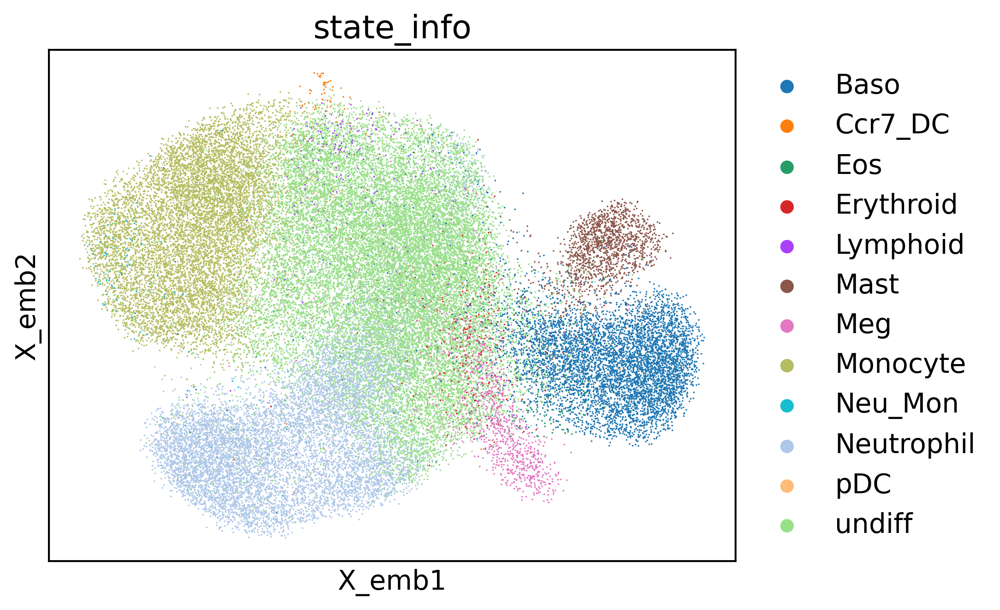

In [522]:
import torch
import umap
adata.obsm["X_pca"] = adata_embeddings

cs.pp.get_X_emb(adata, n_neighbors=20, umap_min_dist=1)
cs.pl.embedding(adata, color="state_info",s=3)


/home/zhengtuo/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


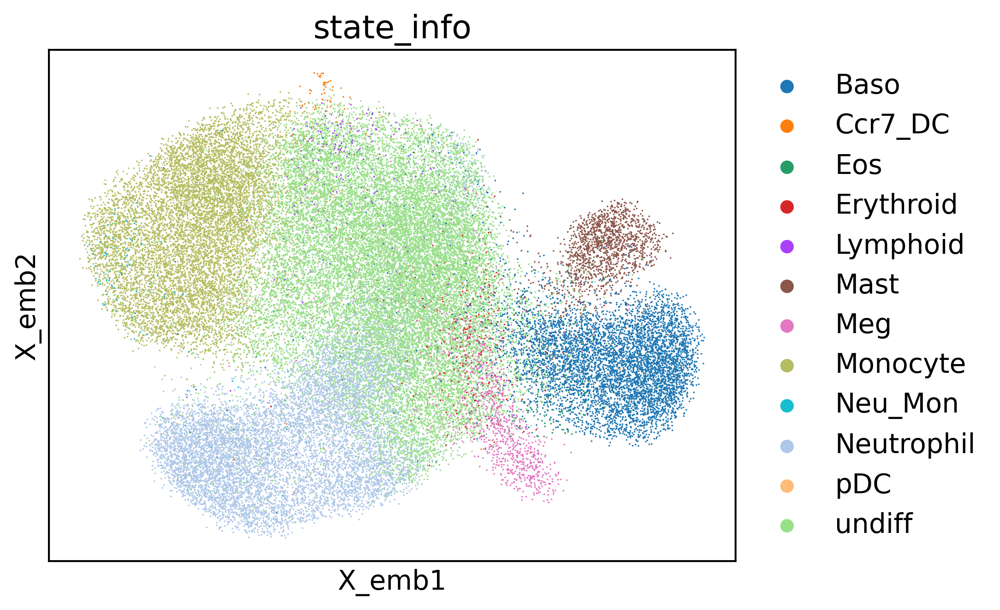

In [504]:
import torch
import umap
adata.obsm["X_pca"] = adata_embeddings

cs.pp.get_X_emb(adata, n_neighbors=20, umap_min_dist=1)
cs.pl.embedding(adata, color="state_info",s=3)


/home/zhengtuo/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


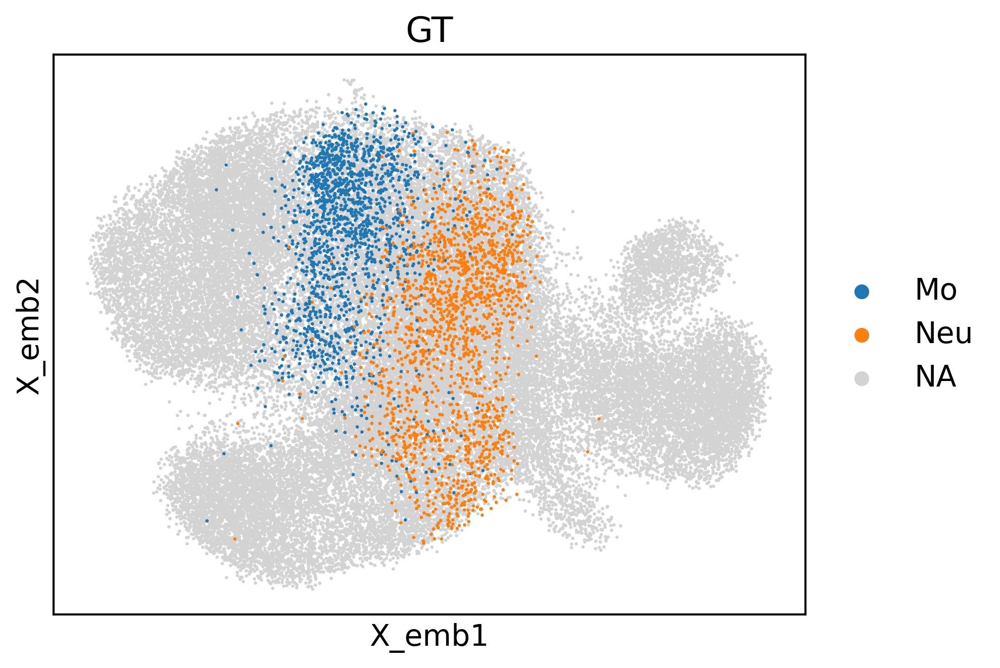

In [523]:
cs.pl.embedding(adata, color="GT",s=10)


/home/zhengtuo/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


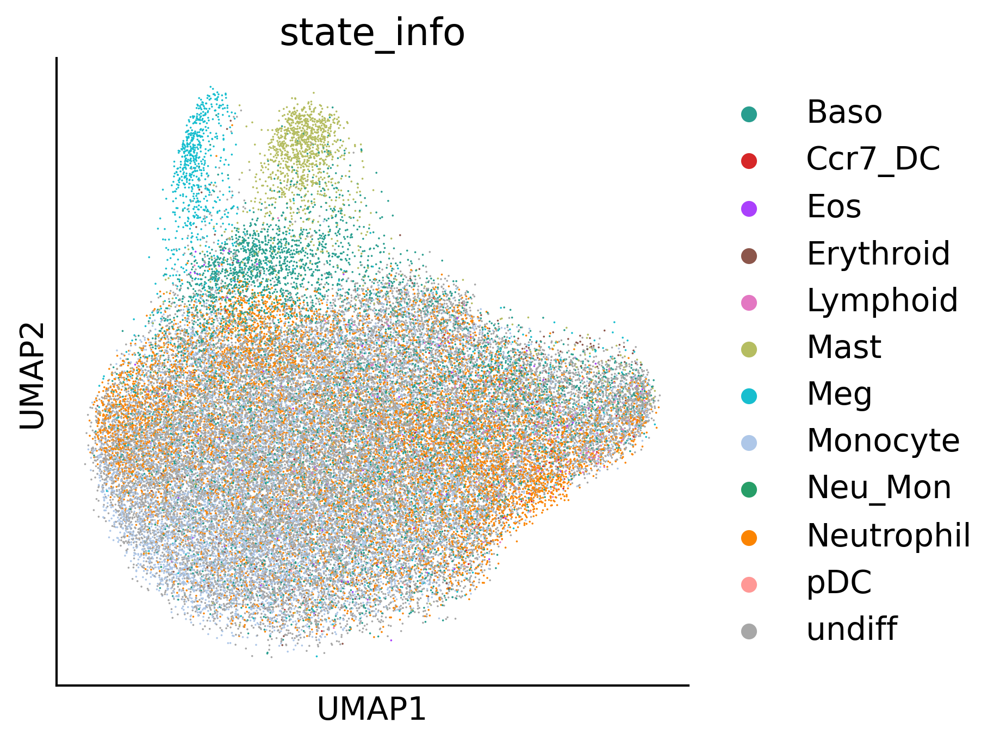

In [399]:
palette = dict(zip(sorted(np.unique(adata.obs['state_info'])), ['#299e8f', '#d62728', '#aa40fc', '#8c564b', '#e377c2', '#b5bd61', '#17becf', '#aec7e8', '#279e68', '#98df8a', '#ff9896', '#c5b0d5', '#c49c94', '#f7b6d2']))
palette['undiff'] = '#A7A7A7'
palette['Neutrophil'] = '#FB8401'
adata.uns['state_info_colors']=palette.values()
#cs.pp.get_X_emb(adata, n_neighbors=20, umap_min_dist=1)
fig,ax=createFig()
fig.set_size_inches(5,5)
#cs.pl.embedding(adata, color="state_info",s=3)
sc.pl.umap(adata, color="state_info",ax=ax,palette=palette, s=3)
#fig.savefig("/tmp/20221128_weinreb_original_embedding.pdf")


In [54]:
adata.obs['fate_pred']=None
adata.obs['fate_pred']=adata.obs['index'].map(dic_fate)
adata.obs

,time_info,state_info,NeuMon_fate_bias,NeuMon_mask,progenitor_Ccr7_DC,progenitor_Mast,progenitor_Meg,progenitor_pDC,progenitor_Eos,progenitor_Lymphoid,progenitor_Erythroid,progenitor_Baso,progenitor_Neutrophil,progenitor_Monocyte,sp_500_idx,MLPClassifier_predicted_bias,growth_rate_raw,growth_rate_smooth,index,fate_pred
0,6,undiff,0.5,True,0,0,0,0,0,0,0,0,0,0,False,1.0,0.0,2.543682,0,NaN
1,6,undiff,0.5,False,0,0,0,0,0,0,0,0,0,0,False,1.0,0.0,0.931491,1,NaN
2,6,Monocyte,0.5,False,0,0,0,0,0,0,0,0,0,0,False,1.0,0.0,1.953304,2,NaN
3,6,undiff,0.5,False,0,0,0,0,0,0,0,0,0,0,False,1.0,0.0,3.032351,3,NaN
4,6,Neutrophil,0.5,False,0,0,0,0,0,0,0,0,0,0,True,1.0,0.0,0.227282,4,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49111,6,undiff,0.5,False,0,0,0,0,0,0,0,0,0,0,False,1.0,0.0,1.713574,49111,NaN
49112,6,undiff,0.5,True,0,0,0,0,0,0,0,0,0,0,False,1.0,0.0,1.565742,49112,NaN
49113,6,Neutrophil,0.5,False,0,0,0,0,0,0,0,0,0,0,False,0.0,0.0,0.929888,49113,NaN
49114,6,Monocyte,0.5,False,0,0,0,0,0,0,0,0,0,0,False,0.0,0.0,0.257967,49114,NaN


In [87]:
adata3=adata[adata.obs['fate_pred'].isin([0,1])].copy()
# adata2.obsm['X_pca']=adata2.obsm['X_pca'].cpu().numpy()
adata3.obs['fate_pred'] = adata3.obs['fate_pred'].astype('category')


In [94]:
adata3.obs

,time_info,state_info,NeuMon_fate_bias,NeuMon_mask,progenitor_Ccr7_DC,progenitor_Mast,progenitor_Meg,progenitor_pDC,progenitor_Eos,progenitor_Lymphoid,progenitor_Erythroid,progenitor_Baso,progenitor_Neutrophil,progenitor_Monocyte,sp_500_idx,MLPClassifier_predicted_bias,growth_rate_raw,growth_rate_smooth,index,fate_pred
4409,4,undiff,1.000000e+00,True,0,0,0,0,0,0,0,0,0,0,False,1.0,1.107143,1.772120,4409,1.0
4411,4,undiff,1.000000e+00,True,0,0,0,0,0,0,0,0,0,0,False,1.0,0.933333,0.616784,4411,1.0
4416,4,undiff,5.000000e-01,False,0,0,0,0,0,0,0,0,0,0,False,0.0,0.117647,1.347678,4416,0.0
4419,4,undiff,1.000000e+00,True,0,0,0,0,0,0,0,0,0,0,False,1.0,0.437500,0.914183,4419,1.0
4425,4,undiff,1.000000e+00,True,0,0,0,0,0,0,0,0,0,0,False,1.0,0.272727,1.080315,4425,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38451,4,undiff,1.000000e-10,True,0,0,0,0,0,0,0,0,0,0,False,0.0,4.000000,6.529863,38451,0.0
38453,4,undiff,1.000000e+00,True,0,0,0,0,0,0,0,0,0,0,False,1.0,4.333333,2.283268,38453,1.0
38455,4,undiff,1.000000e-10,True,0,0,0,0,0,0,0,0,0,0,False,0.0,2.000000,3.144334,38455,0.0
38459,4,undiff,1.000000e-10,True,0,0,0,0,0,0,0,0,0,0,False,0.0,1.000000,1.456318,38459,0.0


In [122]:

# from sklearn.neighbors import KNeighborsClassifier
# #adata3.uns.pop("log1p")
# plt.rcParams['font.size'] = 14
# fig,ax=createFig(figsize=(3,3))
# sc.pl.umap(adata3,color=['fate_pred'],ax=ax,s=10)
# sc.tl.rank_genes_groups(adata3, groupby='fate_pred', method='t-test_overestim_var')
# sc.pl.heatmap(
#     adata3[list(map(lambda x: type(x) == str, adata3.obs['fate_pred']))],  
#     pd.DataFrame(adata3.uns['rank_genes_groups']['names']).head(16).to_numpy().flatten(), 
#     groupby='fate_pred', cmap='Reds'
# )


In [408]:

def ScanpyVolcanoPlot(
    adata3, 
    axis, 
    use_adjusted_p = True, 
    show_label=True, 
    label_fold_change = 2, 
    label_log_p = 80, 
    label_includes=[],
    add_grid=True, 
    label_size=4, 
    color1 = '#F09D30', 
    color2='#3D5FA6',
    max_abs_fc=5,
):
    fig,ax = createFig()
    log2foldchanges = list(map(lambda x: x[axis], adata3.uns['rank_genes_groups']['logfoldchanges']))
    if use_adjusted_p:
        log10adjp = -np.log10(list(map(lambda x: x[axis], adata3.uns['rank_genes_groups']['pvals_adj'])))
    else:
        log10adjp = -np.log10(list(map(lambda x: x[axis], adata3.uns['rank_genes_groups']['pvals'])))
    indices = list(map(lambda x: abs(x) < max_abs_fc, log2foldchanges))
    ax.scatter(
        x = np.array(log2foldchanges)[indices],
        y = np.array(log10adjp[indices]),
        s = 12,
        alpha=0.8,
        linewidth = 0,
        c = list(map(lambda x: color1 if abs(x[0]) > label_fold_change and x[1] > label_log_p and x[0] < 0 \
                 else color2 if abs(x[0]) > label_fold_change and x[1] > label_log_p and x[0] > 0 \
                 else 'gray',  np.array(list(zip(log2foldchanges, log10adjp)))[indices]))
    )
    if add_grid:
        ax.axvline(-label_fold_change, color ="black", alpha = 0.8, lw = 0.8, ls='--')
        ax.axvline(label_fold_change, color ="black", alpha = 0.8, lw = 0.8, ls='--')
        ax.axhline(label_log_p, color ="black", alpha = 0.8, lw = 0.8, ls='--')
        ax.grid(alpha=0.4)
    if show_label:
        indices = list(map(lambda x: abs(x[0]) > label_fold_change and x[1] > label_log_p and abs(x[0]) < max_abs_fc, zip(log2foldchanges, log10adjp)))
        for i,j,s in zip(np.array(log2foldchanges)[indices],np.array(log10adjp)[indices],
             list(map(lambda x: x[axis], adata3.uns['rank_genes_groups']['names'][indices]))):
             ax.text(i,j,s=s, size=label_size)
        for i,j,s in zip(np.array(log2foldchanges),np.array(log10adjp), list(map(lambda x: x[axis], adata3.uns['rank_genes_groups']['names']))):
            if s in label_includes:
                ax.text(i,j,s=s, size=label_size)

    ax.set_xlabel("Log2(FoldChanges)")
    ax.set_ylabel("Log10(FDR)")
    return fig,ax
fig, ax = ScanpyVolcanoPlot(adata3, axis=1,
                           label_fold_change=1,label_log_p=2,
                           label_size=8,show_label=True,label_includes=['DNMT3B'])
ax.set_xbound(-5,5)
fig.set_size_inches(5,5)



In [126]:
# sc.pl.umap(adata[adata.obs['state_info']=='undiff'],color='Fbp1',s=50,cmap='Reds',vmin=0)



In [28]:
adata.obsm['X_clone'].shape

(49116, 5864)

In [27]:
adata = cs.datasets.hematopoiesis()


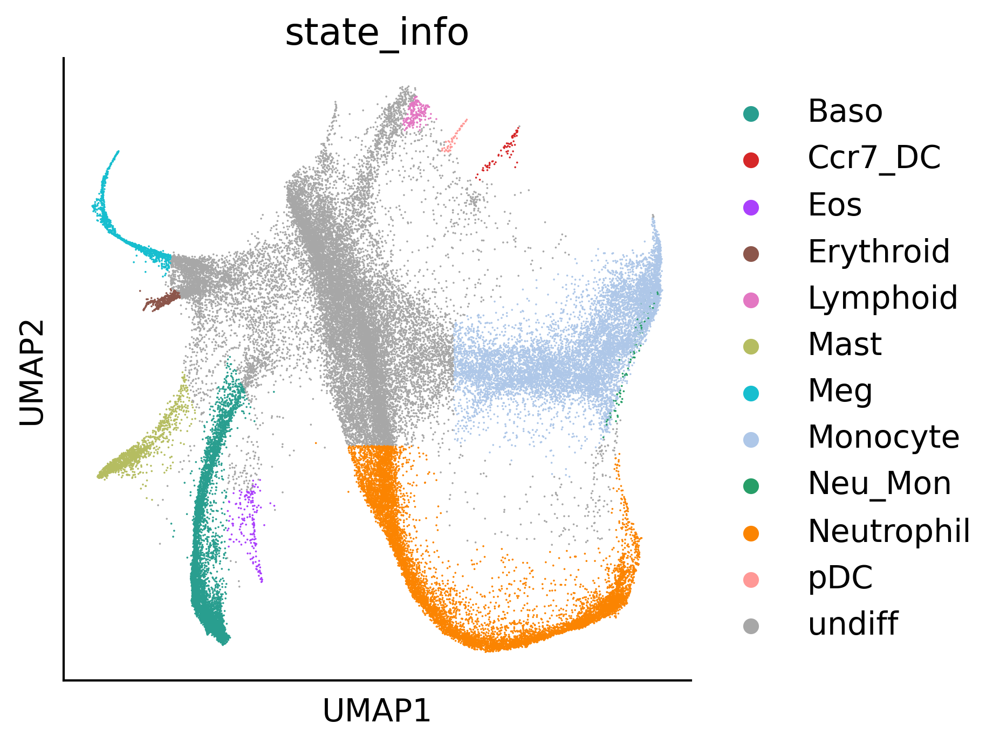

In [215]:
#原本的weinreb结果
fig,ax=createFig()
fig.set_size_inches(5,5)
adata.obsm['X_umap']=adata.obsm['X_emb']
#cs.pp.get_X_emb(adata, n_neighbors=20, umap_min_dist=1)
sc.pl.umap(adata, color="state_info",ax=ax,palette=palette, s=3)

In [166]:
fatetrue=[]
adata2=adata[(adata.obs['NeuMon_fate_bias']!=0.5)&(adata.obs['time_info']!=6) & (adata.obs['state_info']=='undiff')]
for i in range((adata2.shape[0])):
    if(adata2.obs['NeuMon_fate_bias'][i]>0.5):
        fatetrue.append(1)
    else:
        fatetrue.append(0)

In [54]:
# import matplotlib.pyplot as plt
# import torch
# # plt.rcParams['figure.dpi'] = 300
# # plt.rcParams['savefig.dpi'] = 300
# # plt.rcParams['font.size'] = 4
# # plt.rcParams['axes.linewidth'] = 0
# # plt.rcParams['font.family'] = "Arial"

# tmp = adata2
# fig,ax=createFig()
# fig.set_size_inches(5,5)
# ax.scatter(adata.obsm["X_emb"][:,0],adata.obsm["X_emb"][:,1],c="#F7F7F7",s=1)
# cmap={
#   0: '#aec7e8',#Monocyte
#  1: '#FB8401',#Neutrophil
# }
# ax.scatter(tmp.obsm["X_emb"][:,0],tmp.obsm["X_emb"][:,1], s=1, c=list(map(lambda x:cmap[int(x)], fatetrue)))
# plt.show()

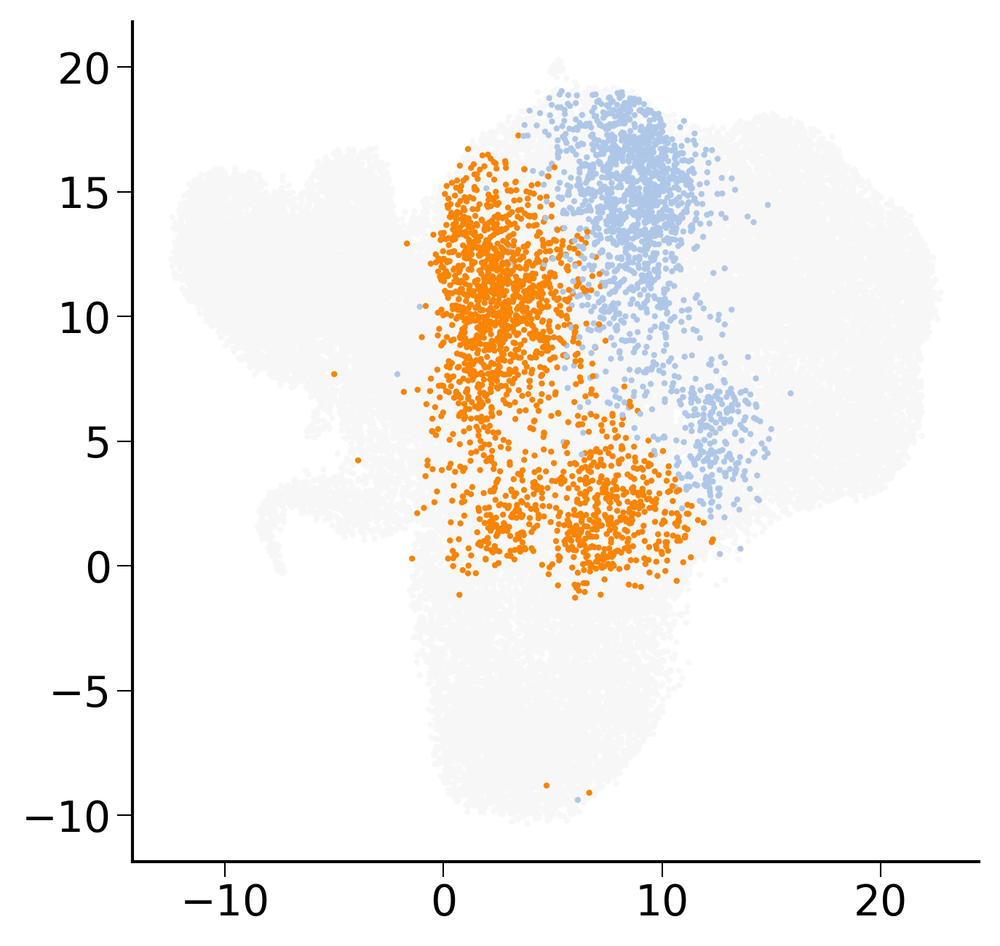

In [120]:
import scanpy as sc
import matplotlib.pyplot as plt
import torch
# plt.rcParams['figure.dpi'] = 300
# plt.rcParams['savefig.dpi'] = 300
# plt.rcParams['font.size'] = 4
# plt.rcParams['axes.linewidth'] = 0
# plt.rcParams['font.family'] = "Arial"

tmp = adata[np.array(list((allindex3))) ,:]
fig,ax=createFig()
fig.set_size_inches(5,5)
ax.scatter(adata.obsm["X_emb"][:,0],adata.obsm["X_emb"][:,1],c="#F7F7F7",s=1)
cmap={
  0: '#aec7e8',#Monocyte
 1: '#FB8401',#Neutrophil
}
ax.scatter(tmp.obsm["X_emb"][:,0],tmp.obsm["X_emb"][:,1], s=1, c=list(map(lambda x:cmap[int(x)], pre)))
plt.show()

In [130]:
from sklearn.metrics import silhouette_score
print(silhouette_score(tmp.obsm["X_emb"], pre))


0.2604455


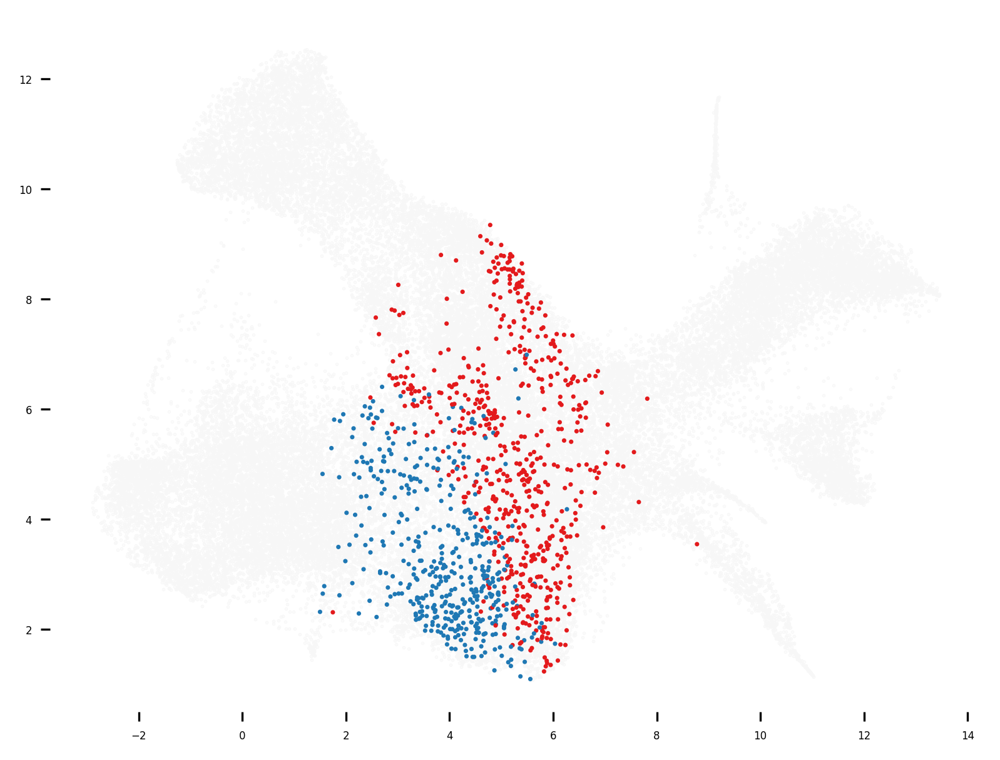

In [524]:

#adata.obsm["X_umap"] = adata.obs.loc[:,['SPRING-x', 'SPRING-y']].to_numpy()
tmp = adata[np.array(np.array((allindex3))) ,:]
#prediction = list(map(lambda x: celltype_category [x], pre_labels))
fig,ax=plt.subplots()
ax.scatter(adata.obsm["X_umap"][:,0],adata.obsm["X_umap"][:,1],c="#F7F7F7",s=0.1)
cmap={
 0: '#1f78b4',#Monocyte
 1: '#e31a1c',#Neutrophil
}
ax.scatter(tmp.obsm["X_umap"][:,0],tmp.obsm["X_umap"][:,1], s=0.5, c=list(map(lambda x:cmap[int(x)], pre)))
plt.show()




In [41]:
def compute_velocity_on_grid(
    X_emb,
    M_emb,
    density=None,
    smooth=None,
    n_neighbors=None,
    min_mass=None,
    autoscale=True,
    adjust_for_stream=False,
    cutoff_perc=None,
):
    # remove invalid cells
    idx_valid = np.isfinite(X_emb.sum(1) + M_emb.sum(1))
    X_emb = X_emb[idx_valid]
    M_emb = M_emb[idx_valid]

    # prepare grid
    n_obs, n_dim = X_emb.shape
    density = 0.5 if density is None else density
    smooth = 0.5 if smooth is None else smooth

    grs = []
    for dim_i in range(n_dim):
        m, M = np.min(X_emb[:, dim_i]), np.max(X_emb[:, dim_i])
        m = m - 0.01 * np.abs(M - m)
        M = M + 0.01 * np.abs(M - m)
        gr = np.linspace(m, M, int(50 * density))
        grs.append(gr)

    meshes_tuple = np.meshgrid(*grs)
    X_grid = np.vstack([i.flat for i in meshes_tuple]).T

    # estimate grid velocities
    if n_neighbors is None:
        n_neighbors = int(n_obs / 50)
    nn = NearestNeighbors(n_neighbors=n_neighbors, n_jobs=-1)
    nn.fit(X_emb)
    dists, neighs = nn.kneighbors(X_grid)

    scale = np.mean([(g[1] - g[0]) for g in grs]) * smooth
    weight = normal.pdf(x=dists, scale=scale)
    p_mass = weight.sum(1)

    V_grid = (M_emb[neighs] * weight[:, :, None]).sum(1)
    V_grid /= np.maximum(1, p_mass)[:, None]
    if min_mass is None:
        min_mass = 1

    if adjust_for_stream:
        X_grid = np.stack([np.unique(X_grid[:, 0]), np.unique(X_grid[:, 1])])
        ns = int(np.sqrt(len(V_grid[:, 0])))
        V_grid = V_grid.T.reshape(2, ns, ns)

        mass = np.sqrt((V_grid ** 2).sum(0))
        min_mass = 10 ** (min_mass - 6)  # default min_mass = 1e-5
        min_mass = np.clip(min_mass, None, np.max(mass) * 0.9)
        cutoff = mass.reshape(V_grid[0].shape) < min_mass

        if cutoff_perc is None:
            cutoff_perc = 5
        length = np.sum(np.mean(np.abs(M_emb[neighs]), axis=1), axis=1).T
        length = length.reshape(ns, ns)
        cutoff |= length < np.percentile(length, cutoff_perc)

        V_grid[0][cutoff] = np.nan
    else:
        min_mass *= np.percentile(p_mass, 99) / 100
        X_grid, V_grid = X_grid[p_mass > min_mass], V_grid[p_mass > min_mass]

        if autoscale:
            V_grid /= 3 * quiver_autoscale(X_grid, V_grid)

    return X_grid, V_grid

def quiver_autoscale(X_emb, V_emb):
    import matplotlib.pyplot as pl

    scale_factor = np.abs(X_emb).max()  # just so that it handles very large values
    fig, ax = pl.subplots()
    Q = ax.quiver(
        X_emb[:, 0] / scale_factor,
        X_emb[:, 1] / scale_factor,
        V_emb[:, 0],
        V_emb[:, 1],
        angles="xy",
        scale_units="xy",
        scale=None,
    )
    Q._init()
    fig.clf()
    pl.close(fig)
    return Q.scale / scale_factor


In [52]:
adata.obsm['genemap'].shape

(49116, 1, 256)

In [53]:
import numpy as np
from scipy.stats import norm as normal
from sklearn.neighbors import NearestNeighbors
import tqdm
sc.pp.neighbors(adata)

X = adata.obsm['geneEnc'][:,0,:]
M = adata.obsm['genemap'][:,0,:]
N = adata.obsp['connectivities']
E = adata.obsm["X_umap"]
norm = lambda x: (x-min(x))/(max(x)-min(x))
nn = NearestNeighbors(n_neighbors=20)
nn.fit(X)
dE = []
for i in tqdm.trange(N.shape[0]):

    D,I = nn.kneighbors( np.array([M[i]]) )
    dE.append( (E[I][0] - E[i]).mean(0))
dE = np.vstack(dE)
gE, gdE = compute_velocity_on_grid(E,dE,density=2, adjust_for_stream=True,smooth=True)
fig,ax=createFig()
fig.set_size_inches(5,5)
palette = sc.pl._tools.scatterplots._get_palette(adata, 'cell_type')
ax.scatter(E[:,0],E[:,1],s=30, linewidths=0,c=list(map(lambda x: palette[x], adata.obs['cell_type'])))
stream_kwargs = {
        "linewidth": 0.5,
        "density": 3,
        "zorder": 3,
        "color": "black",
        "arrowsize":  1,
    
        "arrowstyle": "-|>",
        "maxlength":  10,
        "integration_direction":  "both",
}
ax.streamplot(gE[0],gE[1],gdE[0],gdE[1],**stream_kwargs)


  1%|▎                                      | 354/49116 [00:15<36:28, 22.28it/s]


KeyboardInterrupt: 

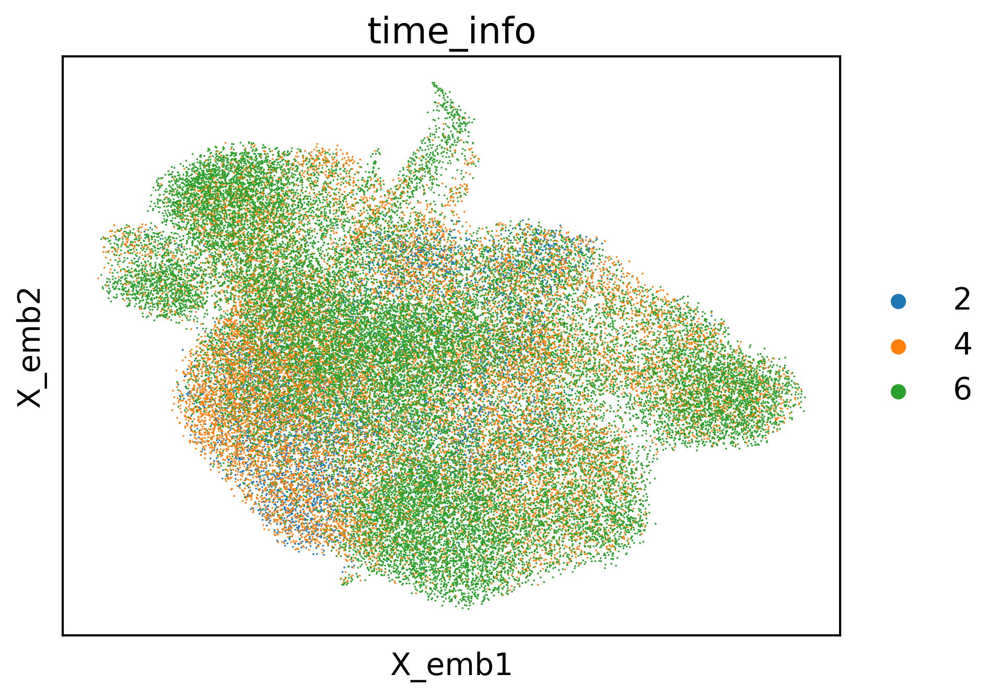

In [192]:
cs.pl.embedding(adata, color="time_info",s=3)